In [3]:
import json
import numpy as np
import pandas as pd
from pathlib import Path
import os
import sys
import warnings
from utils import *
import matplotlib.pyplot as plt

warnings.simplefilter('ignore')

sys.path.append('../../utilities')
sys.path.append('../../models/grt123')
sys.path.append('../../models/grt123/training')
sys.path.append('../../models/grt123/preprocessing/')

# from layers import nms,iou
from summit_utils import *
from evaluation import noduleCADEvaluation

workspace_path = Path(os.getcwd()).parent.parent


# SUMMIT ALL Available Data

## GRT123 - Trained & Eval SUMMIT

/Users/john/Projects/SOTAEvaluationNoduleDetection/models/grt123/bbox_result/trained_summit/summit/partial/partial_metadata.csv
Total number of included nodule annotations: 1116
Total number of nodule annotations: 1116
Cases: 892
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-4739-xfy_Y0_BASELINE_A, nodule Annot ID: 328
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-7465-gny_Y0_BASELINE_A, nodule Annot ID: 718


100%|██████████| 1000/1000 [00:34<00:00, 29.06it/s]


,fps,mean_sens,low_sens,high_sens
0,0.12,0.15,0.13,0.18
159,0.25,0.22,0.19,0.25
476,0.50,0.31,0.28,0.34
1111,1.00,0.41,0.37,0.44
2381,2.00,0.54,0.50,0.58
4920,4.00,0.70,0.67,0.73
9999,8.00,0.83,0.81,0.86


Mean Sensitivity: 0.45 Low Sensitivity: 0.42 High Sensitivity: 0.48


,True positives,995
0,False positives,26867.000
1,False negatives,121.000
2,True negatives,0.000
3,Total number of candidates,27884.000
4,Total number of nodules,1116.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,24.000
7,Sensitivity,0.892
8,Average number of candidates per scan,31.260


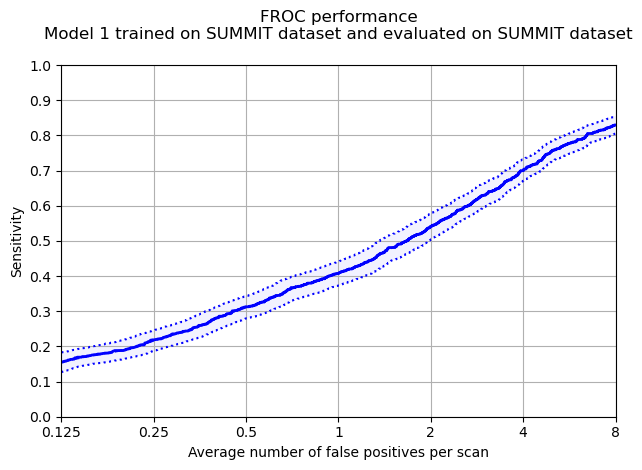

In [4]:
# Add in diameter cuts for later analysis
annotations = pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/partial/partial_metadata.csv')
annotations['diameter_cats'] = pd.cut(
    annotations['diameter_mm'],
    bins=[0, 5, 10, 15, 20, 25, 30, 35, 40, 999],
    labels=['1. 0-5', '2. 5-10', '3. 10-15', '4. 15-20', '5. 20-25', '6. 25-30', '7. 30-35', '8. 35-40', '9. 40+']
)

# save back to the metadata file
annotations.to_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/partial/partial_metadata.csv', index=False)
grt123_summit_summit = noduleCADEvaluation(
    annotations_filename=f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/partial/partial_metadata.csv',
    annotations_excluded_filename=f'{workspace_path}/data/summit/metadata/grt123_annotations_excluded_empty.csv',
    seriesuids_filename=f'{workspace_path}/metadata/summit/partial/test_scans.csv',
    results_filename=f"{workspace_path}/models/grt123/bbox_result/trained_summit/summit/partial/partial_predictions.csv",    
    filter='\nModel 1 trained on SUMMIT dataset and evaluated on SUMMIT dataset\n',
    outputDir=f'{workspace_path}/results/grt123/trained_summit/summit/partial',
)
caluclate_cpm_from_bootstrapping(f'{workspace_path}/results/grt123/trained_summit/summit/partial/froc_partial_predictions_bootstrapping.csv')
show_metrics(f'{workspace_path}/results/grt123/trained_summit/summit/partial/CADAnalysis.txt')

### Gender Analysis 

/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp84_pgb1q/annotations.csv
Total number of included nodule annotations: 456
Total number of nodule annotations: 456
Cases: 362


100%|██████████| 1000/1000 [00:10<00:00, 95.20it/s]


,fps,mean_sens,low_sens,high_sens
0,0.12,0.16,0.13,0.21
159,0.25,0.25,0.19,0.30
476,0.50,0.33,0.28,0.38
1111,1.00,0.43,0.38,0.49
2381,2.00,0.57,0.51,0.63
4920,4.00,0.71,0.66,0.76
9999,8.00,0.83,0.79,0.87


Mean Sensitivity: 0.47 Low Sensitivity: 0.42 High Sensitivity: 0.52


,True positives,401
0,False positives,9454.000
1,False negatives,55.000
2,True negatives,0.000
3,Total number of candidates,9863.000
4,Total number of nodules,456.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,8.000
7,Sensitivity,0.879
8,Average number of candidates per scan,27.246


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp_67n440t/annotations.csv
Total number of included nodule annotations: 660
Total number of nodule annotations: 660
Cases: 531
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-4739-xfy_Y0_BASELINE_A, nodule Annot ID: 328
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-7465-gny_Y0_BASELINE_A, nodule Annot ID: 718


100%|██████████| 1000/1000 [00:22<00:00, 44.35it/s]


,fps,mean_sens,low_sens,high_sens
0,0.12,0.15,0.10,0.19
159,0.25,0.21,0.17,0.25
476,0.50,0.30,0.25,0.34
1111,1.00,0.40,0.35,0.45
2381,2.00,0.53,0.47,0.58
4920,4.00,0.69,0.65,0.73
9999,8.00,0.83,0.80,0.87


Mean Sensitivity: 0.44 Low Sensitivity: 0.4 High Sensitivity: 0.49


,True positives,594
0,False positives,17413.000
1,False negatives,66.000
2,True negatives,0.000
3,Total number of candidates,18021.000
4,Total number of nodules,660.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,16.000
7,Sensitivity,0.900
8,Average number of candidates per scan,33.938


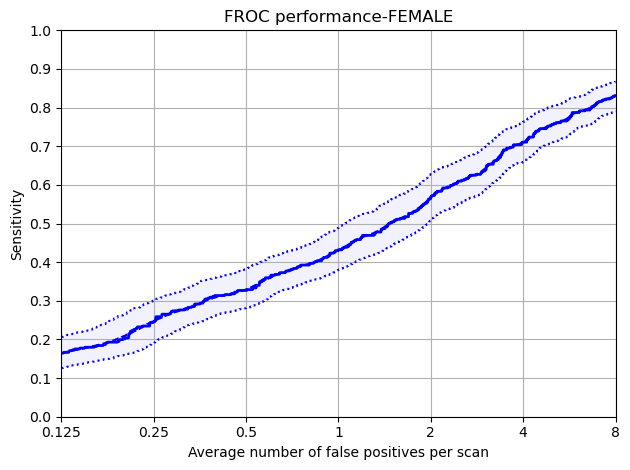

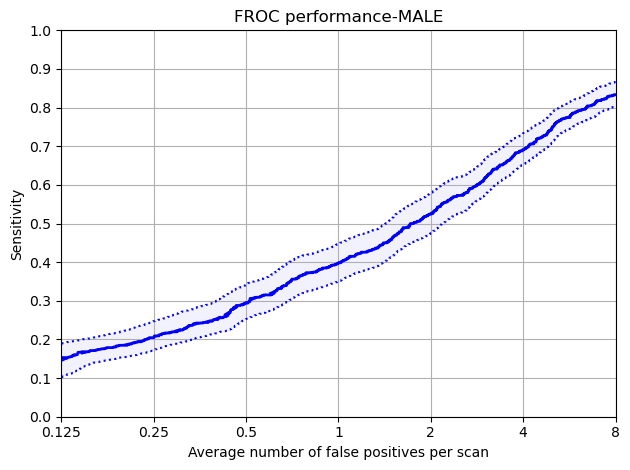

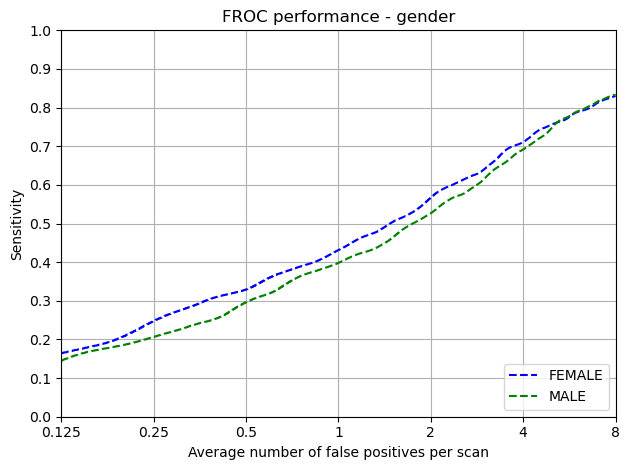

In [5]:

scan_metadata = (
    pd.read_csv(f'{workspace_path}/metadata/summit/partial/test_scans_metadata.csv')
    .assign(name=lambda df: df['LDCT_RADIOLOGY_REPORT_main_participant_id'] + '_Y0_BASELINE_A')
    .assign(gender_by_actionable=lambda df: df.apply(set_gender_by_actionable, axis=1))
    .assign(ethnic_group_by_actionable=lambda df: df.apply(set_ethnic_group_by_actionable, axis=1))
    .rename(columns={
        'participant_details_gender':'gender',
        'lung_health_check_demographics_race_ethnicgroup':'ethnic_group'
    })
)

annotations_excluded = pd.read_csv(f'{workspace_path}/data/summit/metadata/grt123_annotations_excluded_empty.csv')

annotations = pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/partial/partial_metadata.csv')

predictions = pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/partial/partial_predictions.csv')

protected_group = 'gender'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/partial/{protected_group}'
)

### Ethnicity Analysis

/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp8gpvxklz/annotations.csv
Total number of included nodule annotations: 18
Total number of nodule annotations: 18
Cases: 21


100%|██████████| 1000/1000 [00:01<00:00, 970.67it/s]


,fps,mean_sens,low_sens,high_sens
0,0.12,0.18,0.00,0.44
159,0.25,0.21,0.00,0.50
476,0.50,0.24,0.00,0.56
1111,1.00,0.39,0.11,0.67
2381,2.00,0.51,0.20,0.83
4920,4.00,0.83,0.65,1.00
9999,8.00,0.97,0.86,1.00


Mean Sensitivity: 0.48 Low Sensitivity: 0.26 High Sensitivity: 0.71


,True positives,18
0,False positives,625.000
1,False negatives,0.000
2,True negatives,0.000
3,Total number of candidates,644.000
4,Total number of nodules,18.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,1.000
7,Sensitivity,1.000
8,Average number of candidates per scan,30.667


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpy1g4e3ur/annotations.csv
Total number of included nodule annotations: 852
Total number of nodule annotations: 852
Cases: 660
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-4739-xfy_Y0_BASELINE_A, nodule Annot ID: 328
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-7465-gny_Y0_BASELINE_A, nodule Annot ID: 718


100%|██████████| 1000/1000 [00:27<00:00, 35.83it/s]


,fps,mean_sens,low_sens,high_sens
0,0.12,0.15,0.12,0.19
159,0.25,0.22,0.18,0.25
476,0.50,0.32,0.28,0.36
1111,1.00,0.41,0.37,0.45
2381,2.00,0.53,0.49,0.57
4920,4.00,0.69,0.66,0.73
9999,8.00,0.82,0.79,0.85


Mean Sensitivity: 0.45 Low Sensitivity: 0.41 High Sensitivity: 0.49


,True positives,752
0,False positives,20447.000
1,False negatives,100.000
2,True negatives,0.000
3,Total number of candidates,21211.000
4,Total number of nodules,852.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,14.000
7,Sensitivity,0.883
8,Average number of candidates per scan,32.138


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpr8u4b0et/annotations.csv
Total number of included nodule annotations: 71
Total number of nodule annotations: 71
Cases: 66


100%|██████████| 1000/1000 [00:02<00:00, 464.81it/s]


,fps,mean_sens,low_sens,high_sens
0,0.12,0.11,0.03,0.23
159,0.25,0.16,0.06,0.32
476,0.50,0.30,0.17,0.47
1111,1.00,0.39,0.25,0.58
2381,2.00,0.57,0.39,0.78
4920,4.00,0.75,0.59,0.92
9999,8.00,0.86,0.75,0.95


Mean Sensitivity: 0.45 Low Sensitivity: 0.32 High Sensitivity: 0.61


,True positives,64
0,False positives,1897.000
1,False negatives,7.000
2,True negatives,0.000
3,Total number of candidates,1962.000
4,Total number of nodules,71.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,1.000
7,Sensitivity,0.901
8,Average number of candidates per scan,29.727


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpvve01i67/annotations.csv
Total number of included nodule annotations: 147
Total number of nodule annotations: 147
Cases: 117


100%|██████████| 1000/1000 [00:03<00:00, 307.31it/s]


,fps,mean_sens,low_sens,high_sens
0,0.12,0.16,0.05,0.26
159,0.25,0.23,0.14,0.33
476,0.50,0.33,0.25,0.44
1111,1.00,0.42,0.33,0.53
2381,2.00,0.55,0.45,0.67
4920,4.00,0.77,0.69,0.85
9999,8.00,0.91,0.86,0.95


Mean Sensitivity: 0.48 Low Sensitivity: 0.4 High Sensitivity: 0.58


,True positives,138
0,False positives,3045.000
1,False negatives,9.000
2,True negatives,0.000
3,Total number of candidates,3191.000
4,Total number of nodules,147.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,8.000
7,Sensitivity,0.939
8,Average number of candidates per scan,27.274


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpw3rqoj9b/annotations.csv
Total number of included nodule annotations: 28
Total number of nodule annotations: 28
Cases: 32


100%|██████████| 1000/1000 [00:01<00:00, 828.50it/s]


,fps,mean_sens,low_sens,high_sens
0,0.12,0.25,0.06,0.46
159,0.25,0.30,0.08,0.56
476,0.50,0.38,0.13,0.64
1111,1.00,0.58,0.38,0.82
2381,2.00,0.62,0.46,0.84
4920,4.00,0.80,0.62,0.96
9999,8.00,0.83,0.69,1.00


Mean Sensitivity: 0.54 Low Sensitivity: 0.35 High Sensitivity: 0.75


,True positives,23
0,False positives,853.000
1,False negatives,5.000
2,True negatives,0.000
3,Total number of candidates,876.000
4,Total number of nodules,28.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.821
8,Average number of candidates per scan,27.375


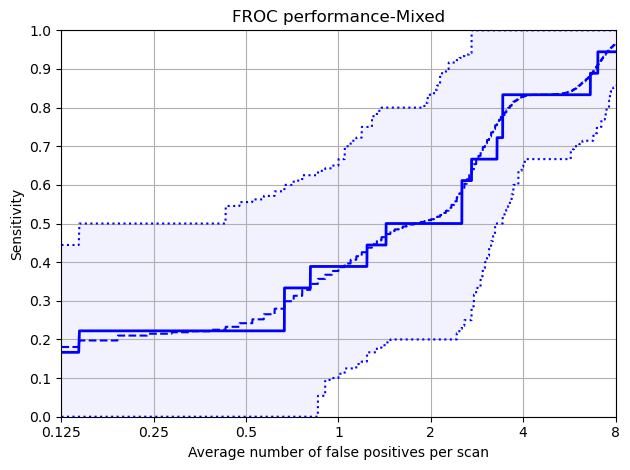

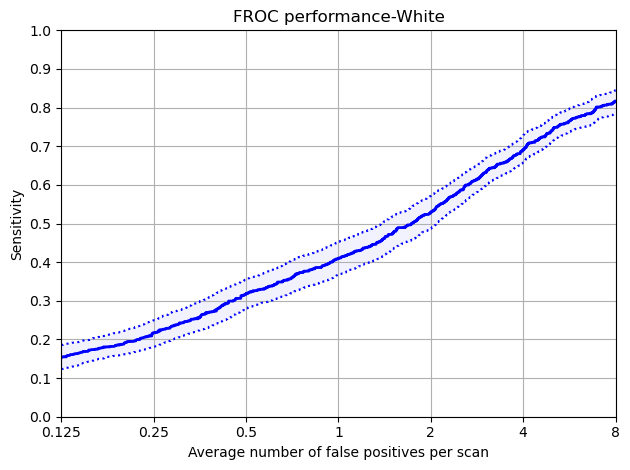

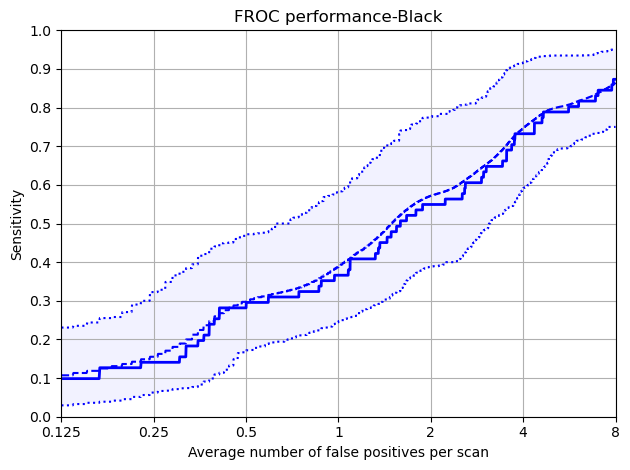

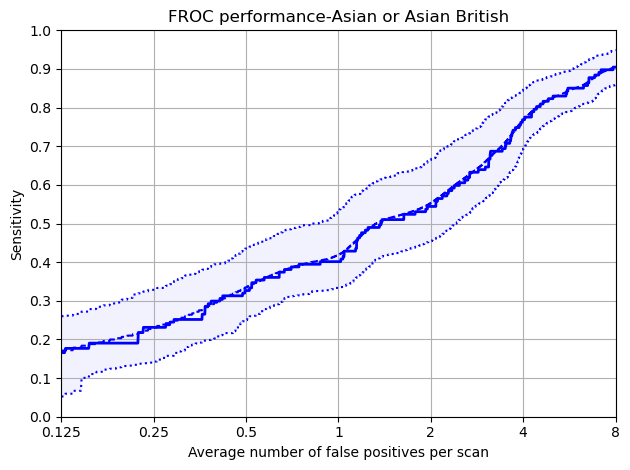

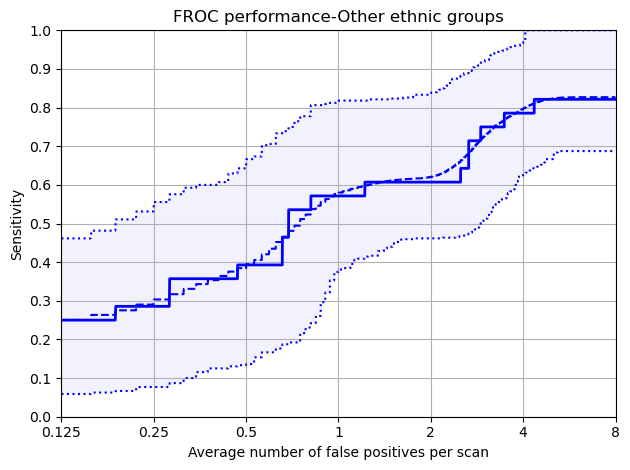

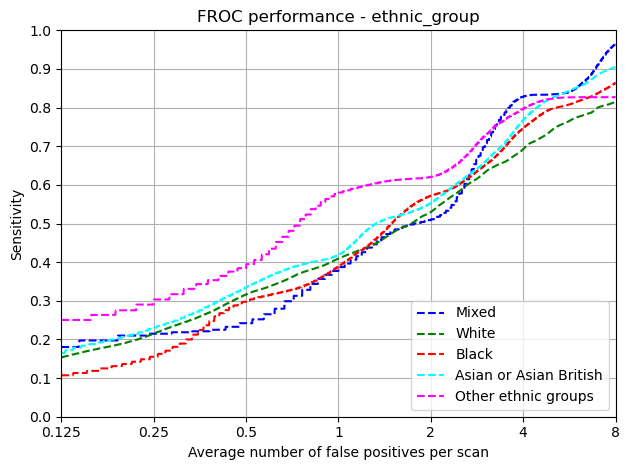

In [6]:
protected_group = 'ethnic_group'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/partial/{protected_group}'
)

### False Positive and Miss Analysis

In [7]:

thresholds = get_thresholds(grt123_summit_summit)
missed_metadata = miss_anaysis_at_fpps(
    scans_path=f'{workspace_path}/metadata/summit/partial/test_scans.csv',
    annotations_path=f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/partial/partial_metadata.csv',
    exclusions_path=f'{workspace_path}/data/summit/metadata/grt123_annotations_excluded_empty.csv',
    predictions_path=f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/partial/partial_predictions.csv',
    thresholds=thresholds
)

/Users/john/Projects/SOTAEvaluationNoduleDetection/models/grt123/bbox_result/trained_summit/summit/partial/partial_metadata.csv
Total number of included nodule annotations: 1116
Total number of nodule annotations: 1116
Cases: 892
Missed Annotations at 7.4244456 FPPs: 943
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/grt123/bbox_result/trained_summit/summit/partial/partial_metadata.csv
Total number of included nodule annotations: 1116
Total number of nodule annotations: 1116
Cases: 892
Missed Annotations at 7.044227 FPPs: 872
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/grt123/bbox_result/trained_summit/summit/partial/partial_metadata.csv
Total number of included nodule annotations: 1116
Total number of nodule annotations: 1116
Cases: 892
Missed Annotations at 6.623532 FPPs: 768
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/grt123/bbox_result/trained_summit/summit/partial/partial_metadata.csv
Total number of included nodule annotations: 1116
Total nu

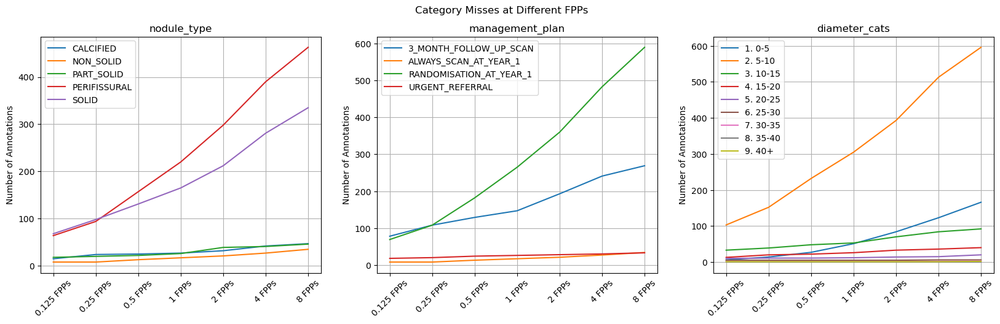

In [8]:
fig, ax = plt.subplots(1, 3, figsize=(20, 5))

for ivx, var in enumerate(['nodule_type','management_plan','diameter_cats']):
    annotations = pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/partial/partial_metadata.csv')
    total_vc = annotations[var].value_counts().sort_index().rename('Total Annotations')

    operating_points = ['0.125', '0.25', '0.5', '1', '2', '4', '8']

    results = []
    for idx, metadata in enumerate(missed_metadata):
        vc = metadata[var].value_counts().sort_index()

        results.append((total_vc - vc).rename(f'{operating_points[idx]} FPPs'))

    df = pd.concat(results, axis=1).fillna(0).round(2)

    for column in df.T:
        ax[ivx].plot(df.T[column], label=column)
    
    ax[ivx].set_xticklabels(labels=df.columns, rotation=45)
    ax[ivx].set_title(var)
    ax[ivx].legend()
    ax[ivx].set_ylabel('Number of Annotations')
    ax[ivx].grid(visible=True, which='both')

plt.suptitle('Category Misses at Different FPPs')
plt.show()

In [9]:

thresholds = get_thresholds(grt123_summit_summit)

scans = pd.read_csv(f'{workspace_path}/metadata/summit/partial/test_scans.csv')
predictions = pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/partial/partial_predictions.csv')
annotations = pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/partial/partial_metadata.csv')

false_positives_fpps = false_positive_analysis(
    thresholds=thresholds,    
    predictions=predictions,
    annotations=annotations
)

predictions: 283 at threshold: 7.4244456
distance false positives: 110 at threshold: 7.4244456
predictions: 468 at threshold: 7.044227
distance false positives: 224 at threshold: 7.044227
predictions: 792 at threshold: 6.623532
distance false positives: 444 at threshold: 6.623532
predictions: 1348 at threshold: 6.0737205
distance false positives: 893 at threshold: 6.0737205
predictions: 2381 at threshold: 5.2962136
distance false positives: 1777 at threshold: 5.2962136
predictions: 4353 at threshold: 4.0496693
distance false positives: 3570 at threshold: 4.0496693
predictions: 8091 at threshold: 2.1779246
distance false positives: 7162 at threshold: 2.1779246


summit-5948-yhn_Y0_BASELINE_A already exists
summit-5948-yhn_Y0_BASELINE_A already exists
[[165.45       116.08        59.19000305  13.08750687]
 [144.2        179.77       183.75000305  11.51973261]
 [131.51        52.72        44.66000305  14.45078883]
 [119.22       107.45       232.36000305   7.9070354 ]
 [ 88.41       184.53        71.71000305  19.22227571]]
summit-5948-yhn_Y0_BASELINE_A - 209.16454 57.2943 225.74036 21.070585
False Positive: True
IoU False Positive: 0.0


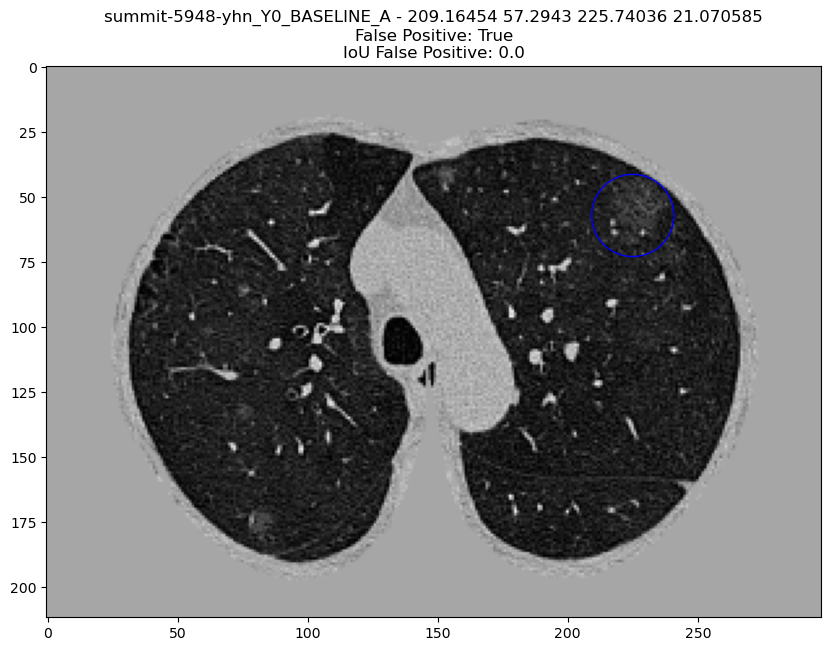

summit-7373-tew_Y0_BASELINE_A already exists
summit-7373-tew_Y0_BASELINE_A already exists
[[255.105      131.83       100.92999695   6.13945091]
 [141.405      184.95       192.58999695  14.12733865]
 [148.235      193.95       215.54999695  12.47694862]]
summit-7373-tew_Y0_BASELINE_A - 156.87303 189.42369 209.74971 23.695738
False Positive: True
IoU False Positive: 0.06116814046914847


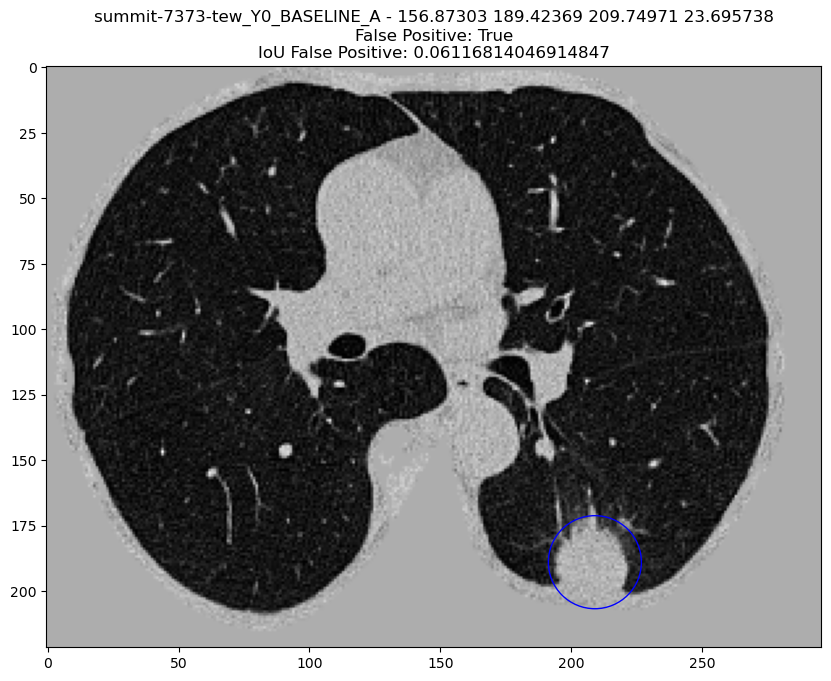

summit-5454-pag_Y0_BASELINE_A already exists
summit-5454-pag_Y0_BASELINE_A already exists
[[ 94.53       183.06       216.5099939   19.44257476]
 [155.46       145.36        39.4999939    8.48027197]
 [111.51       108.39        17.3199939    4.55038984]
 [ 98.94        77.82        95.1699939    7.65292836]
 [ 83.1        160.79       186.1599939    9.10077968]]
summit-5454-pag_Y0_BASELINE_A - 73.12067 129.2764 265.58777 22.49437
False Positive: True
IoU False Positive: 0.0


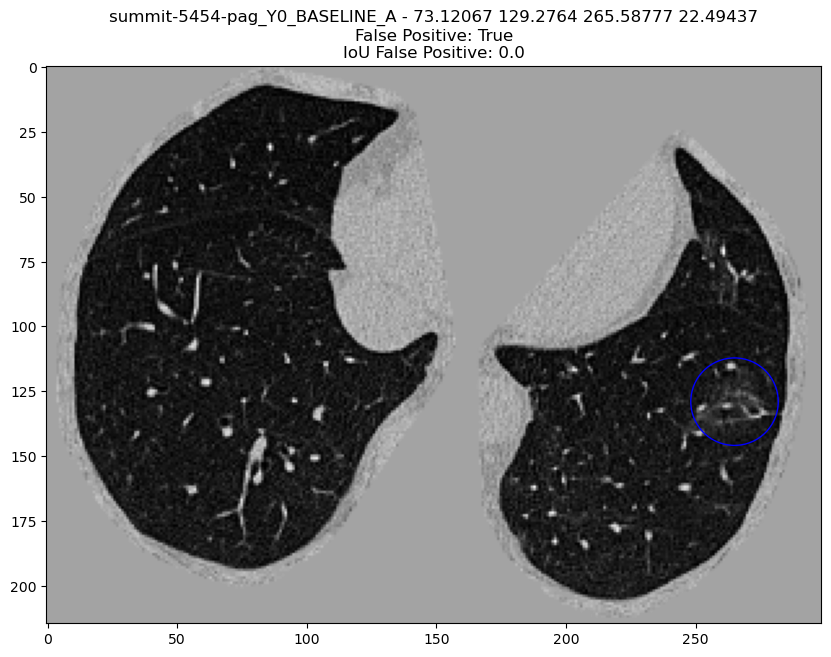

summit-3547-tau_Y0_BASELINE_A already exists
summit-3547-tau_Y0_BASELINE_A already exists
[[216.13      113.23      213.75        6.5390625]]
summit-3547-tau_Y0_BASELINE_A - 97.96274 157.00098 33.76166 10.071281
False Positive: True
IoU False Positive: 0.0


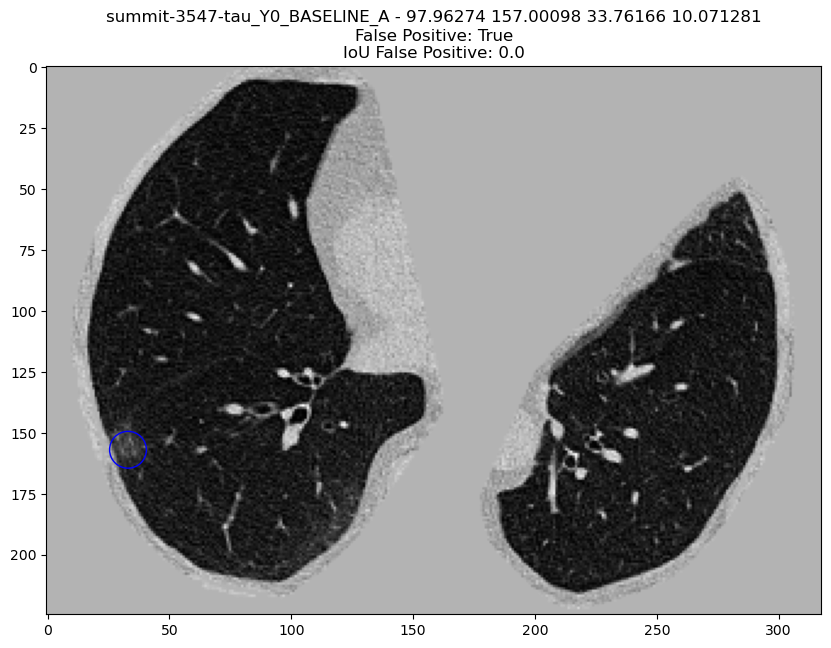

summit-3655-zea_Y0_BASELINE_A already exists
summit-3655-zea_Y0_BASELINE_A already exists
[[218.68       160.         183.94000305   5.15742381]]
summit-3655-zea_Y0_BASELINE_A - 108.84778 24.761692 128.95341 9.168856
False Positive: True
IoU False Positive: 0.0


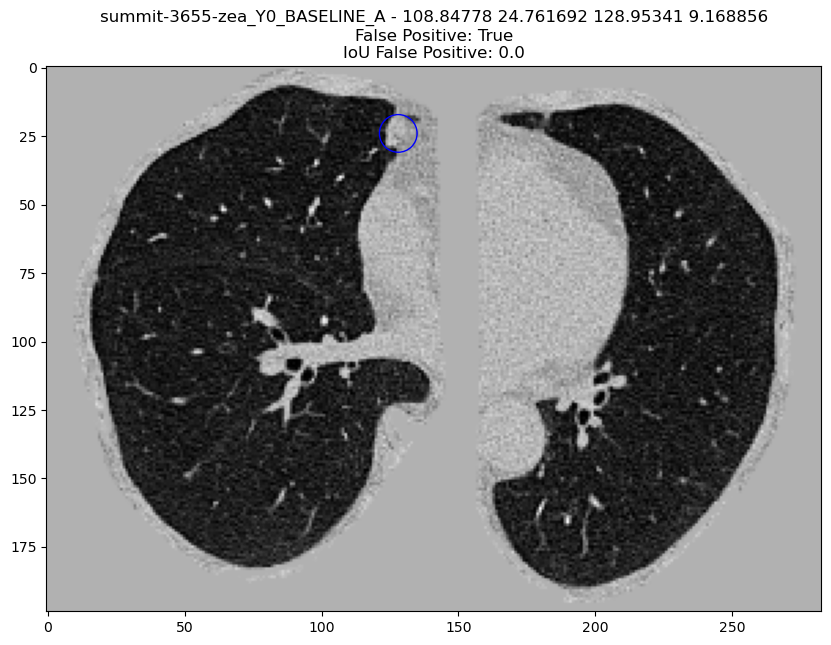

summit-2569-vtk_Y0_BASELINE_A already exists
summit-2569-vtk_Y0_BASELINE_A already exists
[[171.31       101.44       104.7800061    6.88125114]]
summit-2569-vtk_Y0_BASELINE_A - 57.164436 213.43843 217.56244 21.130445
False Positive: True
IoU False Positive: 0.0


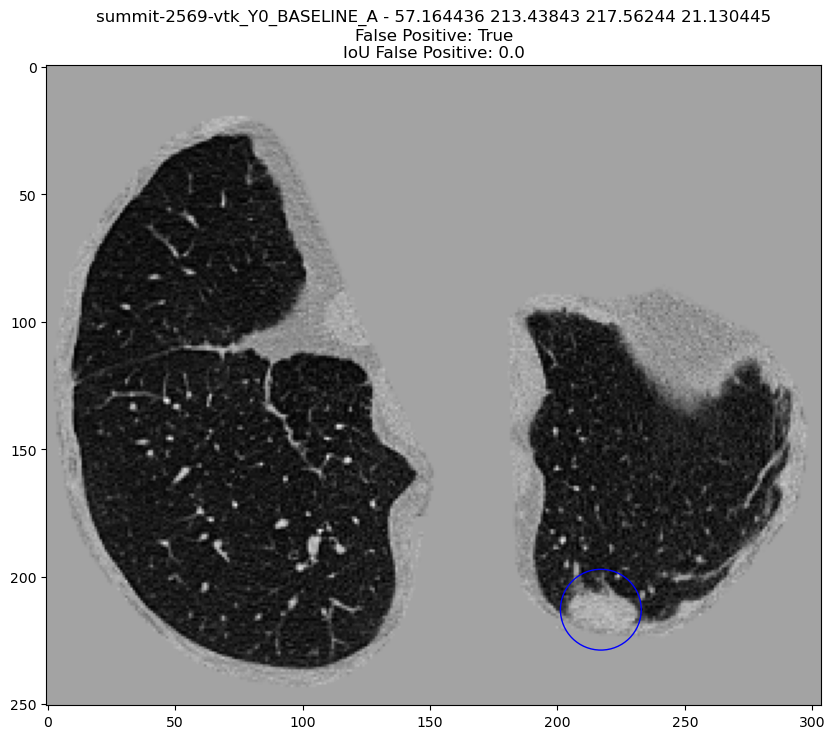

summit-2569-vtk_Y0_BASELINE_A already exists
summit-2569-vtk_Y0_BASELINE_A already exists
[[171.31       101.44       104.7800061    6.88125114]]
summit-2569-vtk_Y0_BASELINE_A - 164.29924 185.29884 50.244396 4.9391594
False Positive: True
IoU False Positive: 0.0


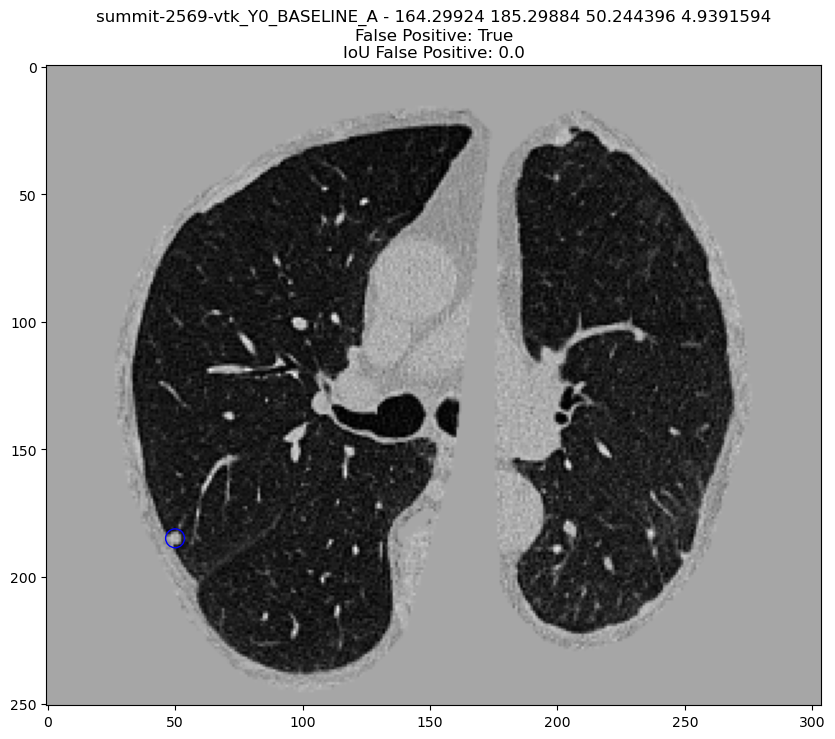

summit-4495-pez_Y0_BASELINE_A already exists
summit-4495-pez_Y0_BASELINE_A already exists
[[0 0 0 0]]
summit-4495-pez_Y0_BASELINE_A - 70.392166 46.468697 238.08766 7.0392513
False Positive: True
IoU False Positive: nan


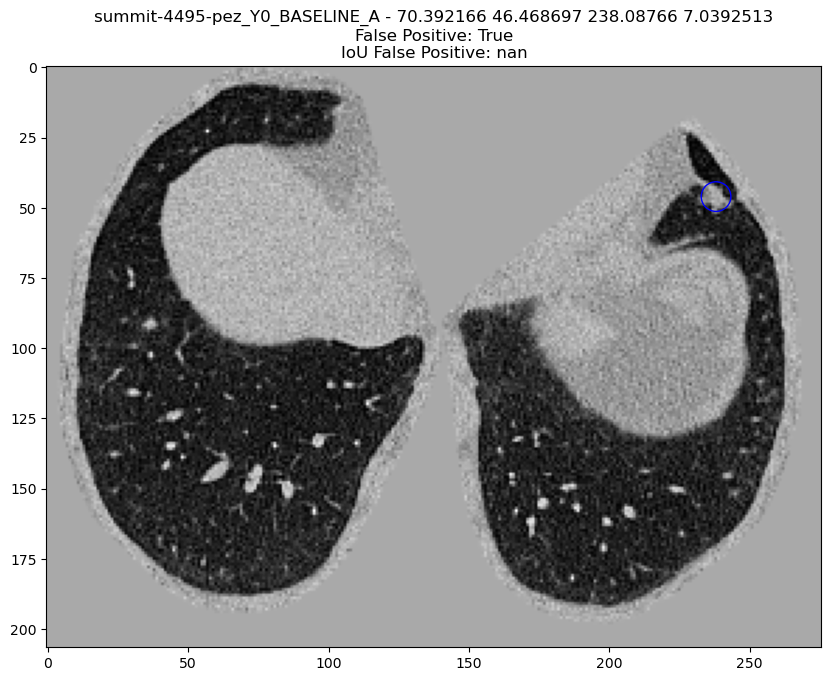

summit-9969-sep_Y0_BASELINE_A already exists
summit-9969-sep_Y0_BASELINE_A already exists
[[198.05       122.12000305  30.92         4.93280859]
 [233.53       162.28000305  95.84        10.70780401]
 [146.82        49.10000305  93.43         3.48905973]
 [182.89        42.53000305 212.89         5.41405821]]
summit-9969-sep_Y0_BASELINE_A - 128.60866 168.9447 41.01317 7.3780074
False Positive: True
IoU False Positive: 0.0


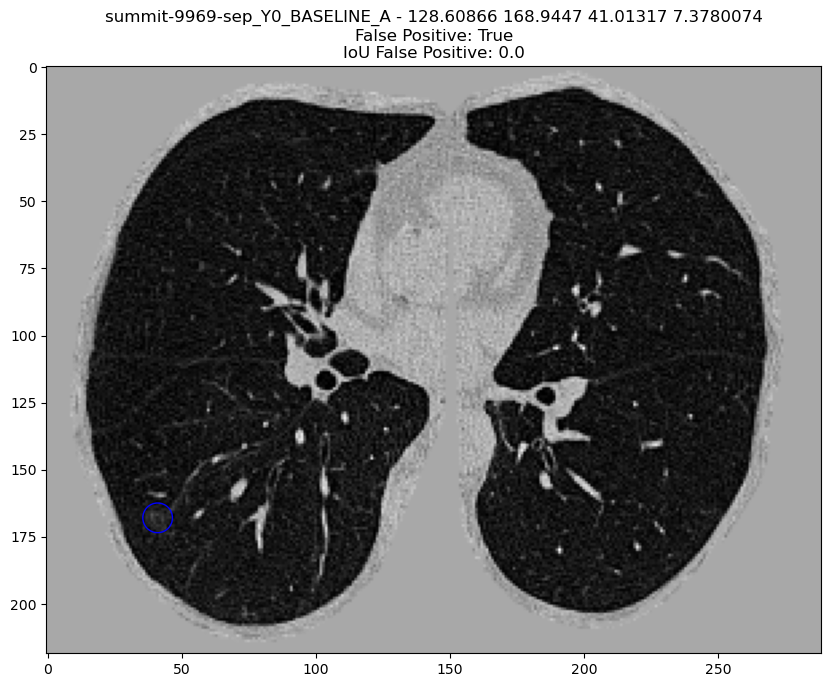

summit-8793-zfp_Y0_BASELINE_A already exists
summit-8793-zfp_Y0_BASELINE_A already exists
[[238.49       164.66       184.9599939    4.17773364]]
summit-8793-zfp_Y0_BASELINE_A - 289.55338 161.37811 193.81535 21.154222
False Positive: True
IoU False Positive: 0.0


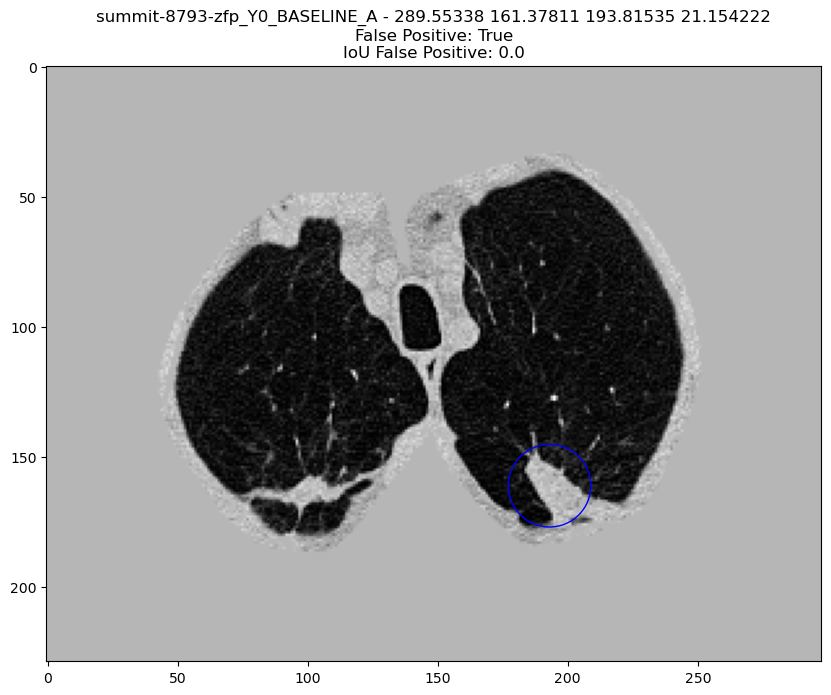

summit-7569-jnf_Y0_BASELINE_A already exists
summit-7569-jnf_Y0_BASELINE_A already exists
[[148.045  182.87   263.69     7.3125]]
summit-7569-jnf_Y0_BASELINE_A - 198.1009 98.13516 40.887123 4.631627
False Positive: True
IoU False Positive: 0.0


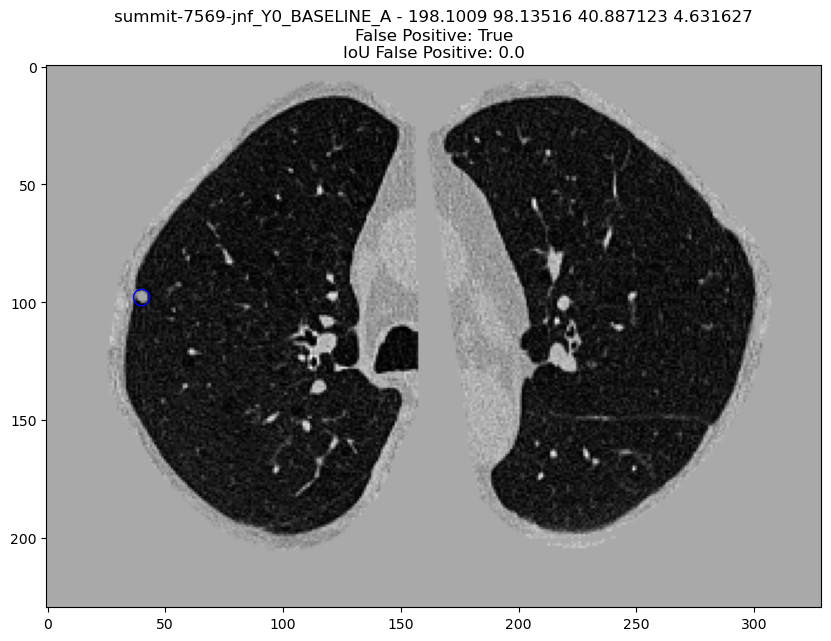

summit-8523-vrw_Y0_BASELINE_A already exists
summit-8523-vrw_Y0_BASELINE_A already exists
[[199.265      114.0900061  250.02999695   6.325     ]
 [194.615      174.0300061  182.63999695   3.1625    ]
 [239.455      137.7800061   88.71999695   3.665625  ]
 [237.445      124.9600061  263.73999695   5.4625    ]
 [241.765      110.9000061  104.89999695   6.18125   ]
 [239.715      140.2100061  256.59999695   4.025     ]
 [221.425      103.7300061   69.22999695   4.025     ]
 [252.945      125.2900061   80.23999695   6.18125   ]
 [110.215      182.3500061   39.44999695   4.3125    ]
 [126.685       39.2000061  147.45999695   7.7625    ]
 [243.945      122.6700061   89.94999695   3.665625  ]
 [227.905       97.0400061  128.24999695   4.3125    ]
 [161.515       73.9300061   84.32999695   6.396875  ]]
summit-8523-vrw_Y0_BASELINE_A - 97.34816 78.30638 280.81345 5.2098823
False Positive: True
IoU False Positive: 0.0


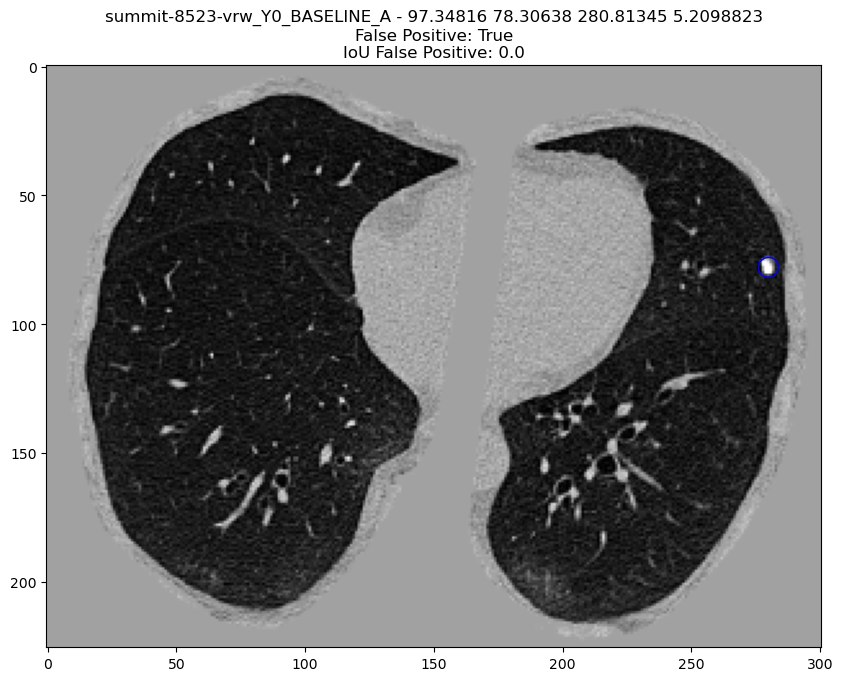

In [10]:
# For each scan with false positives copy them over locally and inspect them using centre ... will need to pull the npy file as this is
# the GRT123 model so references are all based on numpy arrays

cnt = 0
df = false_positives_fpps['0.125']

for idx, row in df[df.distance_false_positive].sort_values(by='threshold', ascending=False).iterrows():
    study_id = row['name']
    x = row['row']
    y = row['col']
    z = row['index']
    diameter = row['diameter']
    

    copy_numpy_from_cluster(study_id)
    show_numpy_candidate_location(study_id, x, y, z, diameter, row.distance_false_positive, row.iou_false_positive)
    cnt+=1
    if cnt == 12:
        break

## MONAI Detection - Trained & Eval on SUMMIT

/Users/john/Projects/SOTAEvaluationNoduleDetection/models/detection/result/trained_summit/summit/partial/partial.json
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/detection/result/trained_summit/summit/partial/annotations.csv
Total number of included nodule annotations: 1116
Total number of nodule annotations: 1116
Cases: 892
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-4739-xfy_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-4739-xfy_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-4739-xfy_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-4739-xfy_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD ma

100%|██████████| 1000/1000 [00:55<00:00, 17.98it/s]


,fps,mean_sens,low_sens,high_sens
0,0.12,0.16,0.13,0.19
159,0.25,0.25,0.21,0.29
476,0.50,0.38,0.34,0.42
1111,1.00,0.54,0.49,0.58
2381,2.00,0.68,0.63,0.72
4920,4.00,0.76,0.71,0.80
9999,8.00,0.81,0.76,0.85


Mean Sensitivity: 0.51 Low Sensitivity: 0.47 High Sensitivity: 0.55


,True positives,944
0,False positives,44062.000
1,False negatives,172.000
2,True negatives,0.000
3,Total number of candidates,45995.000
4,Total number of nodules,1116.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,999.000
7,Sensitivity,0.846
8,Average number of candidates per scan,51.564


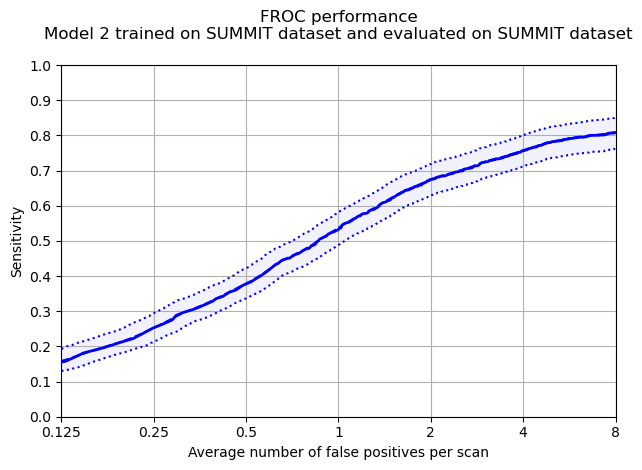

In [11]:


detection_predictions_path = combine_predictions(f'{workspace_path}/models/detection/result/trained_summit/summit/partial', 'test')
detection_predictions = pd.read_csv(detection_predictions_path)

annotations = (
    pd.read_csv(f'{workspace_path}/metadata/summit/partial/test_metadata.csv')
    .assign(name=lambda df: df.participant_id + '_Y0_BASELINE_A')
    .assign(row=lambda df: df['nodule_x_coordinate'])
    .assign(col=lambda df: df['nodule_y_coordinate'])
    .assign(index=lambda df: df['nodule_z_coordinate'])
    .assign(diameter=lambda df: df['nodule_diameter_mm'])
    .assign(diameter_cats=lambda df: pd.cut(
        df['nodule_diameter_mm'],
        bins=[0, 5, 10, 15, 20, 25, 30, 35, 40, 999],
        labels=['1. 0-5', '2. 5-10', '3. 10-15', '4. 15-20', '5. 20-25', '6. 25-30', '7. 30-35', '8. 35-40', '9. 40+']
    ))
)

annotations.to_csv(f'{workspace_path}/models/detection/result/trained_summit/summit/partial/annotations.csv', index=False)

detection_summit_summit = noduleCADEvaluation(
    annotations_filename=f'{workspace_path}/models/detection/result/trained_summit/summit/partial/annotations.csv',
    annotations_excluded_filename=f'{workspace_path}/data/summit/metadata/annotations_excluded_empty.csv',
    seriesuids_filename=f'{workspace_path}/metadata/summit/partial/test_scans.csv',
    results_filename=detection_predictions_path,
    filter='\nModel 2 trained on SUMMIT dataset and evaluated on SUMMIT dataset\n',
    outputDir=f'{workspace_path}/results/detection/trained_summit/partial',
)
caluclate_cpm_from_bootstrapping(f'{workspace_path}/results/detection/trained_summit/partial/froc_predictions_bootstrapping.csv')
show_metrics(f'{workspace_path}/results/detection/trained_summit/partial/CADAnalysis.txt')



### Gender analysis

/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpioqtqhc_/annotations.csv
Total number of included nodule annotations: 456
Total number of nodule annotations: 456
Cases: 362


100%|██████████| 1000/1000 [00:17<00:00, 55.89it/s]


,fps,mean_sens,low_sens,high_sens
0,0.12,0.14,0.10,0.20
159,0.25,0.25,0.18,0.32
476,0.50,0.38,0.30,0.45
1111,1.00,0.52,0.44,0.60
2381,2.00,0.64,0.55,0.72
4920,4.00,0.70,0.60,0.78
9999,8.00,0.75,0.65,0.84


Mean Sensitivity: 0.48 Low Sensitivity: 0.4 High Sensitivity: 0.56


,True positives,361
0,False positives,17563.000
1,False negatives,95.000
2,True negatives,0.000
3,Total number of candidates,18323.000
4,Total number of nodules,456.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,399.000
7,Sensitivity,0.792
8,Average number of candidates per scan,50.616


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpy78fzadi/annotations.csv
Total number of included nodule annotations: 660
Total number of nodule annotations: 660
Cases: 531
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-4739-xfy_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-4739-xfy_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-4739-xfy_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-4739-xfy_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-4739-xfy_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark No

100%|██████████| 1000/1000 [00:29<00:00, 34.20it/s]


,fps,mean_sens,low_sens,high_sens
0,0.12,0.17,0.13,0.21
159,0.25,0.25,0.21,0.31
476,0.50,0.38,0.33,0.44
1111,1.00,0.55,0.50,0.61
2381,2.00,0.70,0.65,0.74
4920,4.00,0.79,0.75,0.83
9999,8.00,0.85,0.80,0.88


Mean Sensitivity: 0.53 Low Sensitivity: 0.48 High Sensitivity: 0.57


,True positives,583
0,False positives,26499.000
1,False negatives,77.000
2,True negatives,0.000
3,Total number of candidates,27672.000
4,Total number of nodules,660.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,600.000
7,Sensitivity,0.883
8,Average number of candidates per scan,52.113


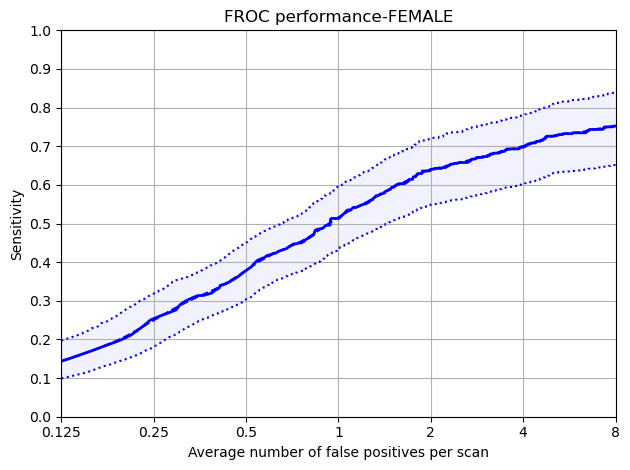

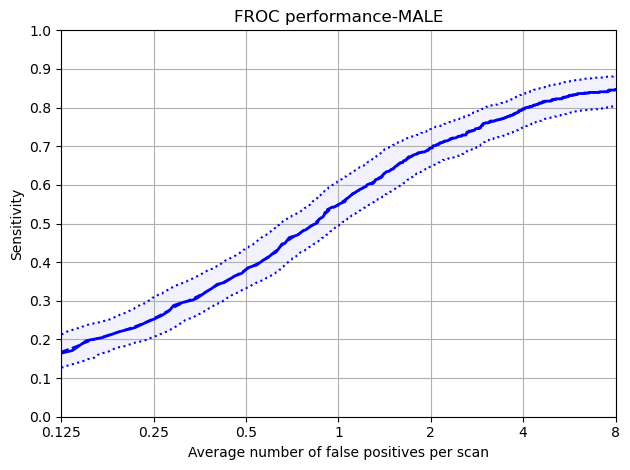

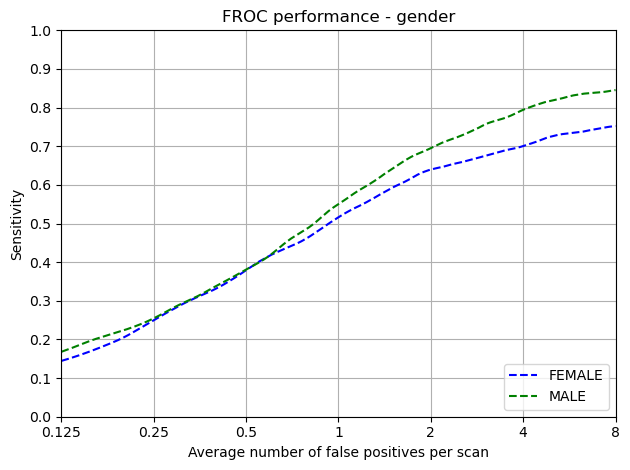

In [12]:
annotations = pd.read_csv(f'{workspace_path}/models/detection/result/trained_summit/summit/partial/annotations.csv')

predictions = pd.read_csv(detection_predictions_path)

protected_group = 'gender'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/partial/{protected_group}'
)

### Ethnicity Analysis

/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpvtdy6xmp/annotations.csv
Total number of included nodule annotations: 18
Total number of nodule annotations: 18
Cases: 21


100%|██████████| 1000/1000 [00:01<00:00, 772.31it/s]


,fps,mean_sens,low_sens,high_sens
0,0.12,0.02,0.00,0.12
159,0.25,0.05,0.00,0.25
476,0.50,0.18,0.00,0.50
1111,1.00,0.53,0.23,1.00
2381,2.00,0.82,0.57,1.00
4920,4.00,0.83,0.60,1.00
9999,8.00,0.93,0.75,1.00


Mean Sensitivity: 0.48 Low Sensitivity: 0.31 High Sensitivity: 0.7


,True positives,18
0,False positives,957.000
1,False negatives,0.000
2,True negatives,0.000
3,Total number of candidates,1011.000
4,Total number of nodules,18.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,36.000
7,Sensitivity,1.000
8,Average number of candidates per scan,48.143


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpgnhyc06q/annotations.csv
Total number of included nodule annotations: 852
Total number of nodule annotations: 852
Cases: 660
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-4739-xfy_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-4739-xfy_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-4739-xfy_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-4739-xfy_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-4739-xfy_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark No

100%|██████████| 1000/1000 [00:47<00:00, 21.24it/s]


,fps,mean_sens,low_sens,high_sens
0,0.12,0.16,0.13,0.21
159,0.25,0.26,0.21,0.30
476,0.50,0.38,0.33,0.42
1111,1.00,0.53,0.48,0.58
2381,2.00,0.67,0.63,0.71
4920,4.00,0.75,0.71,0.79
9999,8.00,0.81,0.77,0.85


Mean Sensitivity: 0.51 Low Sensitivity: 0.47 High Sensitivity: 0.55


,True positives,726
0,False positives,34035.000
1,False negatives,126.000
2,True negatives,0.000
3,Total number of candidates,35504.000
4,Total number of nodules,852.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,753.000
7,Sensitivity,0.852
8,Average number of candidates per scan,53.794


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp05ucxqml/annotations.csv
Total number of included nodule annotations: 71
Total number of nodule annotations: 71
Cases: 66


100%|██████████| 1000/1000 [00:03<00:00, 289.77it/s]


,fps,mean_sens,low_sens,high_sens
0,0.12,0.23,0.06,0.50
159,0.25,0.37,0.14,0.64
476,0.50,0.47,0.21,0.76
1111,1.00,0.57,0.26,0.88
2381,2.00,0.64,0.30,0.95
4920,4.00,0.67,0.31,0.97
9999,8.00,0.67,0.31,0.97


Mean Sensitivity: 0.52 Low Sensitivity: 0.23 High Sensitivity: 0.81


,True positives,47
0,False positives,2400.000
1,False negatives,24.000
2,True negatives,0.000
3,Total number of candidates,2490.000
4,Total number of nodules,71.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,43.000
7,Sensitivity,0.662
8,Average number of candidates per scan,37.727


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpggwt0ihu/annotations.csv
Total number of included nodule annotations: 147
Total number of nodule annotations: 147
Cases: 117


100%|██████████| 1000/1000 [00:07<00:00, 134.31it/s]


,fps,mean_sens,low_sens,high_sens
0,0.12,0.13,0.07,0.21
159,0.25,0.20,0.12,0.31
476,0.50,0.35,0.24,0.48
1111,1.00,0.52,0.42,0.63
2381,2.00,0.67,0.57,0.76
4920,4.00,0.79,0.69,0.88
9999,8.00,0.83,0.71,0.92


Mean Sensitivity: 0.5 Low Sensitivity: 0.4 High Sensitivity: 0.6


,True positives,125
0,False positives,5300.000
1,False negatives,22.000
2,True negatives,0.000
3,Total number of candidates,5560.000
4,Total number of nodules,147.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,135.000
7,Sensitivity,0.850
8,Average number of candidates per scan,47.521


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpdm8box4j/annotations.csv
Total number of included nodule annotations: 28
Total number of nodule annotations: 28
Cases: 32


100%|██████████| 1000/1000 [00:02<00:00, 489.78it/s]


,fps,mean_sens,low_sens,high_sens
0,0.12,0.24,0.06,0.57
159,0.25,0.40,0.13,0.71
476,0.50,0.62,0.38,0.85
1111,1.00,0.80,0.61,0.95
2381,2.00,0.87,0.70,1.00
4920,4.00,0.95,0.86,1.00
9999,8.00,0.96,0.88,1.00


Mean Sensitivity: 0.69 Low Sensitivity: 0.52 High Sensitivity: 0.87


,True positives,28
0,False positives,1370.000
1,False negatives,0.000
2,True negatives,0.000
3,Total number of candidates,1430.000
4,Total number of nodules,28.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,32.000
7,Sensitivity,1.000
8,Average number of candidates per scan,44.688


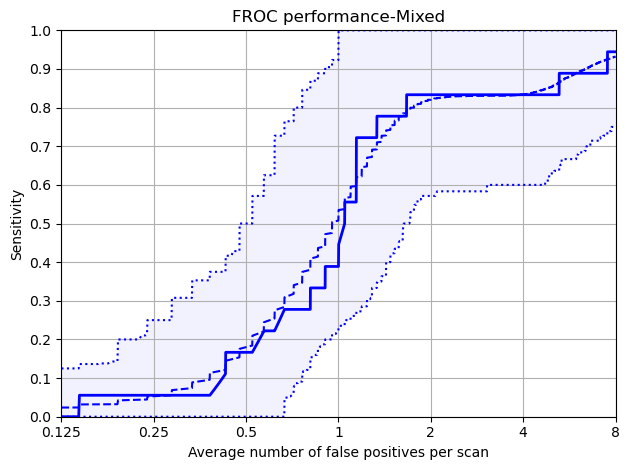

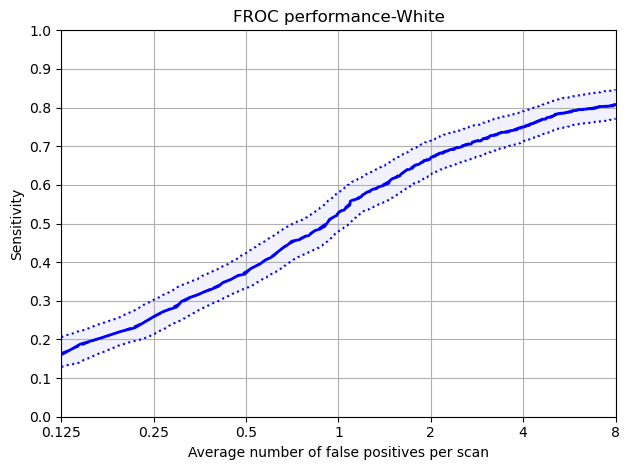

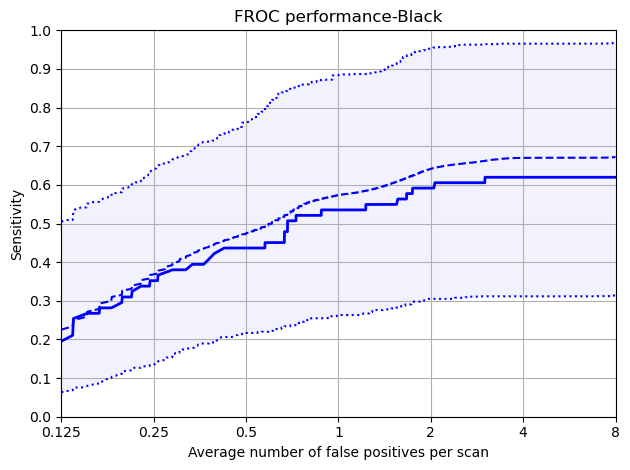

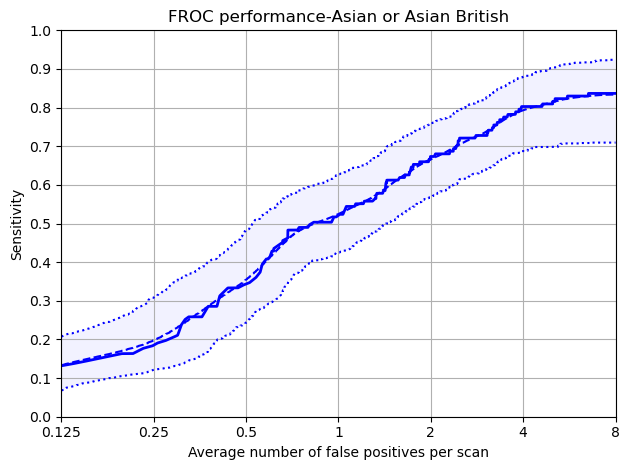

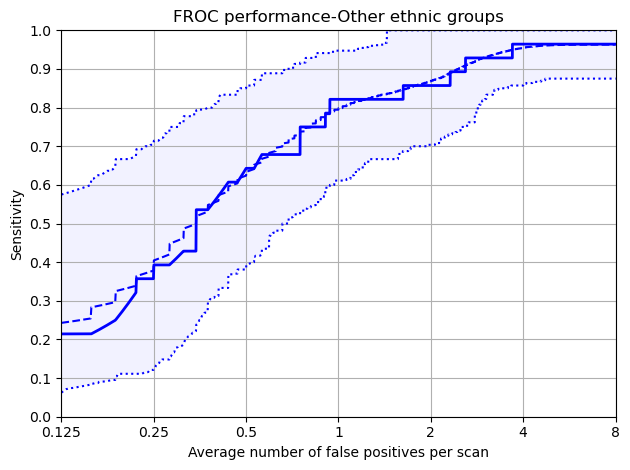

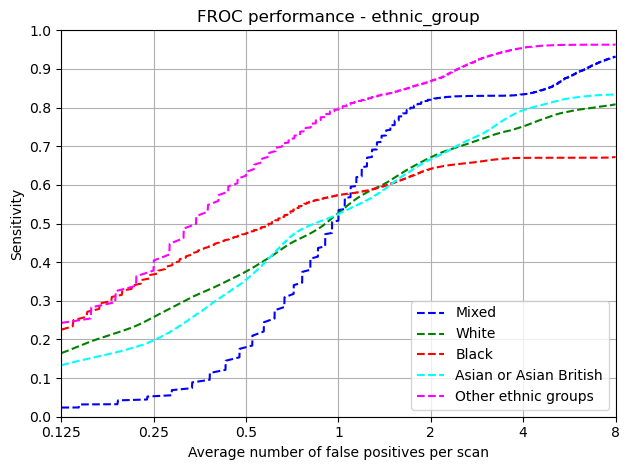

In [13]:
protected_group = 'ethnic_group'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/partial/{protected_group}'
)

### False Positive And Miss Analysis

In [14]:
thresholds = get_thresholds(detection_summit_summit)
print(thresholds)
missed_metadata = miss_anaysis_at_fpps(
    scans_path=f'{workspace_path}/metadata/summit/partial/test_scans.csv',
    annotations_path=f'{workspace_path}/models/detection/result/trained_summit/summit/partial/annotations.csv',
    exclusions_path=f'{workspace_path}/data/summit/metadata/annotations_excluded_empty.csv',
    predictions_path=detection_predictions_path,
    thresholds=thresholds
)

[0.9970703125, 0.994140625, 0.9873046875, 0.97021484375, 0.91845703125, 0.76708984375, 0.451171875]
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/detection/result/trained_summit/summit/partial/annotations.csv
Total number of included nodule annotations: 1116
Total number of nodule annotations: 1116
Cases: 892
Missed Annotations at 0.9970703125 FPPs: 960
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/detection/result/trained_summit/summit/partial/annotations.csv
Total number of included nodule annotations: 1116
Total number of nodule annotations: 1116
Cases: 892
Missed Annotations at 0.994140625 FPPs: 850
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/detection/result/trained_summit/summit/partial/annotations.csv
Total number of included nodule annotations: 1116
Total number of nodule annotations: 1116
Cases: 892
Missed Annotations at 0.9873046875 FPPs: 701
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/detection/result/trained_summit/summit/

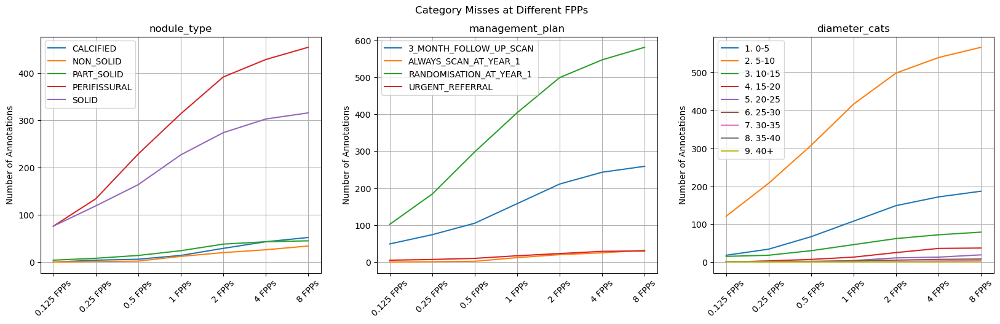

In [15]:

import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 3, figsize=(20, 5))

for ivx, var in enumerate(['nodule_type','management_plan','diameter_cats']):
    annotations = pd.read_csv(f'{workspace_path}/models/detection/result/trained_summit/summit/partial/annotations.csv')
    total_vc = annotations[var].value_counts().sort_index().rename('Total Annotations')

    operating_points = ['0.125', '0.25', '0.5', '1', '2', '4', '8']

    results = []
    for idx, metadata in enumerate(missed_metadata):
        vc = metadata[var].value_counts().sort_index()

        results.append((total_vc - vc).rename(f'{operating_points[idx]} FPPs'))

    df = pd.concat(results, axis=1).fillna(0).round(2)

    for column in df.T:
        ax[ivx].plot(df.T[column], label=column)
    
    ax[ivx].set_xticklabels(labels=df.columns, rotation=45)
    ax[ivx].set_title(var)
    ax[ivx].legend()
    ax[ivx].set_ylabel('Number of Annotations')
    ax[ivx].grid(visible=True, which='both')

plt.suptitle('Category Misses at Different FPPs')
plt.show()

In [16]:
scans = pd.read_csv(f'{workspace_path}/metadata/summit/partial/test_scans.csv')
predictions = pd.read_csv(detection_predictions_path)
annotations = pd.read_csv(f'{workspace_path}/models/detection/result/trained_summit/summit/partial/annotations.csv')

false_positives_fpps = false_positive_analysis(
    thresholds=thresholds,    
    predictions=predictions,
    annotations=annotations
)

predictions: 272 at threshold: 0.9970703125
distance false positives: 116 at threshold: 0.9970703125
predictions: 515 at threshold: 0.994140625
distance false positives: 249 at threshold: 0.994140625
predictions: 926 at threshold: 0.9873046875
distance false positives: 511 at threshold: 0.9873046875
predictions: 1607 at threshold: 0.97021484375
distance false positives: 1016 at threshold: 0.97021484375
predictions: 2776 at threshold: 0.91845703125
distance false positives: 2024 at threshold: 0.91845703125
predictions: 4854 at threshold: 0.76708984375
distance false positives: 3996 at threshold: 0.76708984375
predictions: 8988 at threshold: 0.451171875
distance false positives: 7991 at threshold: 0.451171875


summit-9943-hnh_Y0_BASELINE_A already exists
summit-9943-hnh_Y0_BASELINE_A already exists
summit-9943-hnh_Y0_BASELINE_A - 154 329 160 8.203125
False Positive: True
IoU False Positive: nan


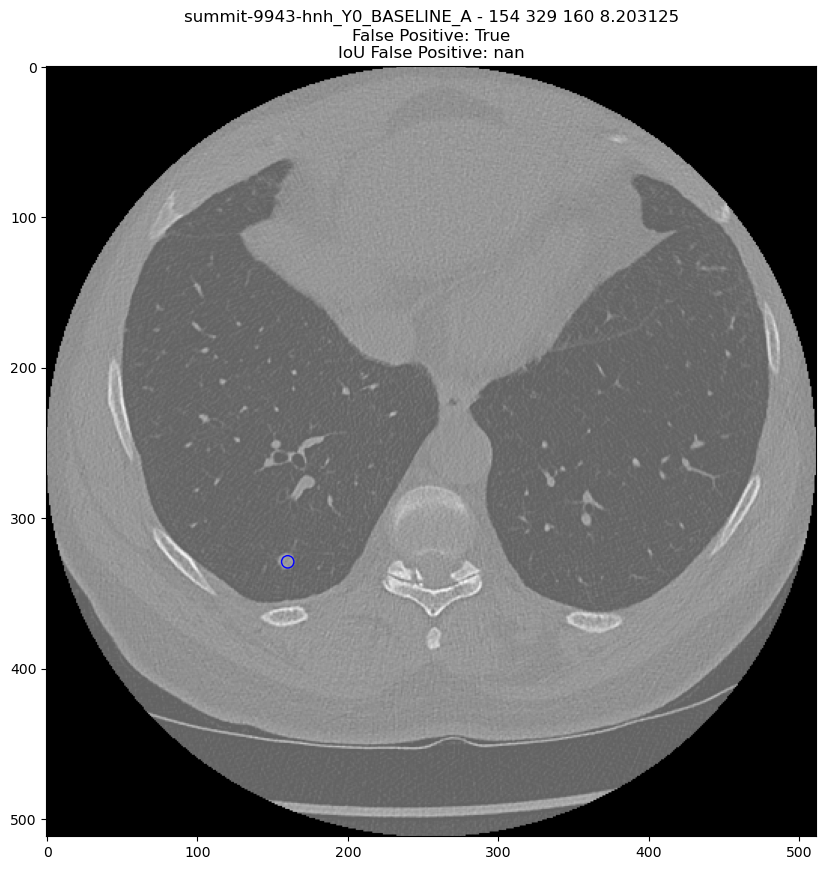

summit-2757-yfv_Y0_BASELINE_A already exists
summit-2757-yfv_Y0_BASELINE_A already exists


MetaImage: M_ReadElementsData: data not read completely
   ideal = 189095472 : actual = 121241600


summit-2757-yfv_Y0_BASELINE_A - 301 145 335 5.625
False Positive: True
IoU False Positive: nan


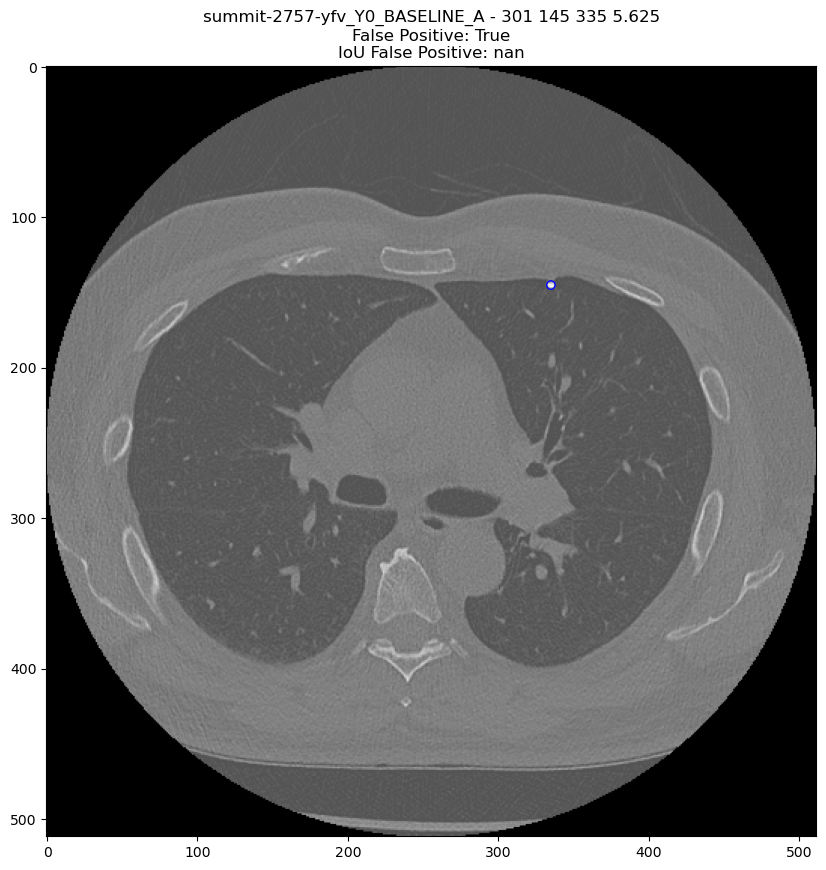

summit-4846-apv_Y0_BASELINE_A already exists
summit-4846-apv_Y0_BASELINE_A already exists
summit-4846-apv_Y0_BASELINE_A - 309 187 378 6.328125
False Positive: True
IoU False Positive: nan


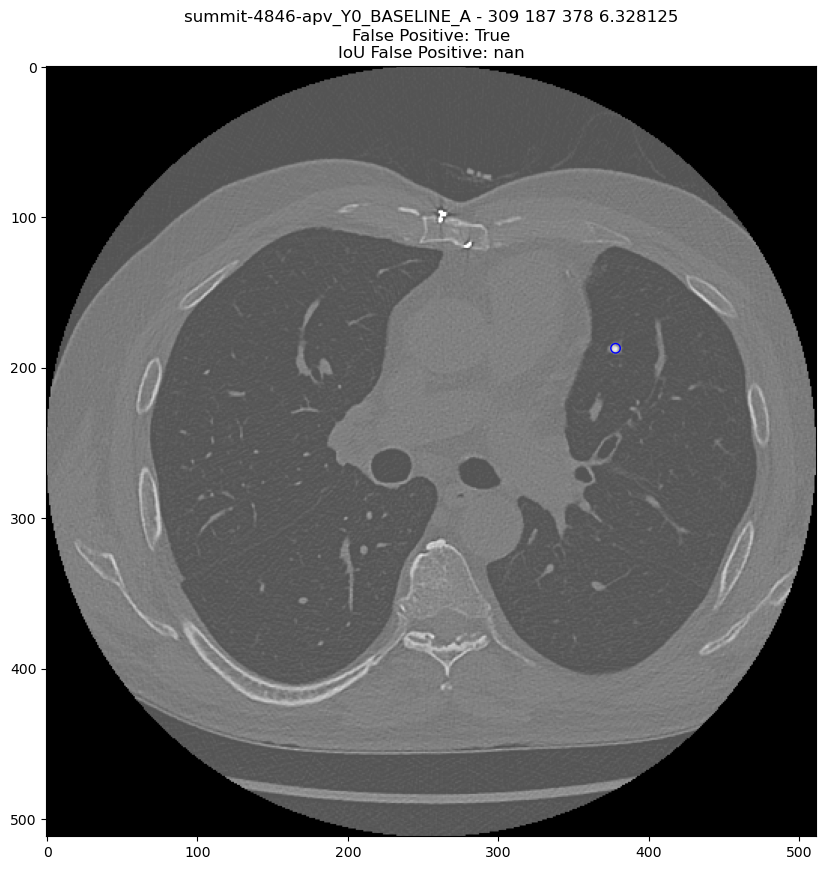

summit-4923-wcj_Y0_BASELINE_A already exists
summit-4923-wcj_Y0_BASELINE_A already exists
summit-4923-wcj_Y0_BASELINE_A - 215 364 145 5.80078125
False Positive: True
IoU False Positive: nan


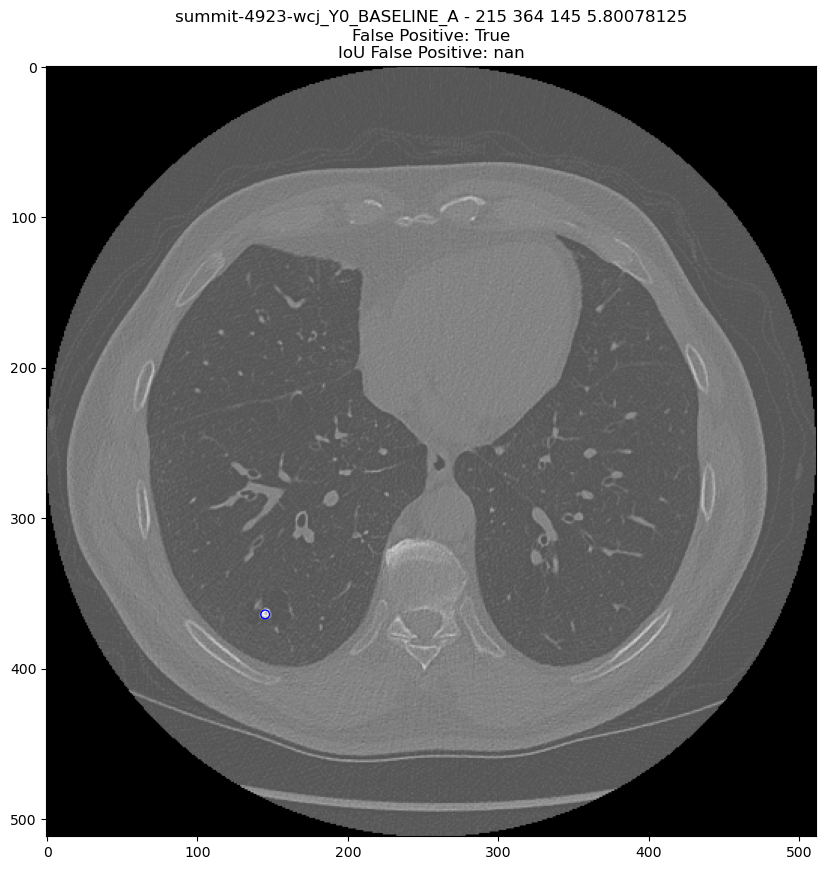

summit-9567-shy_Y0_BASELINE_A already exists
summit-9567-shy_Y0_BASELINE_A already exists
summit-9567-shy_Y0_BASELINE_A - 82 327 449 6.767578125
False Positive: True
IoU False Positive: nan


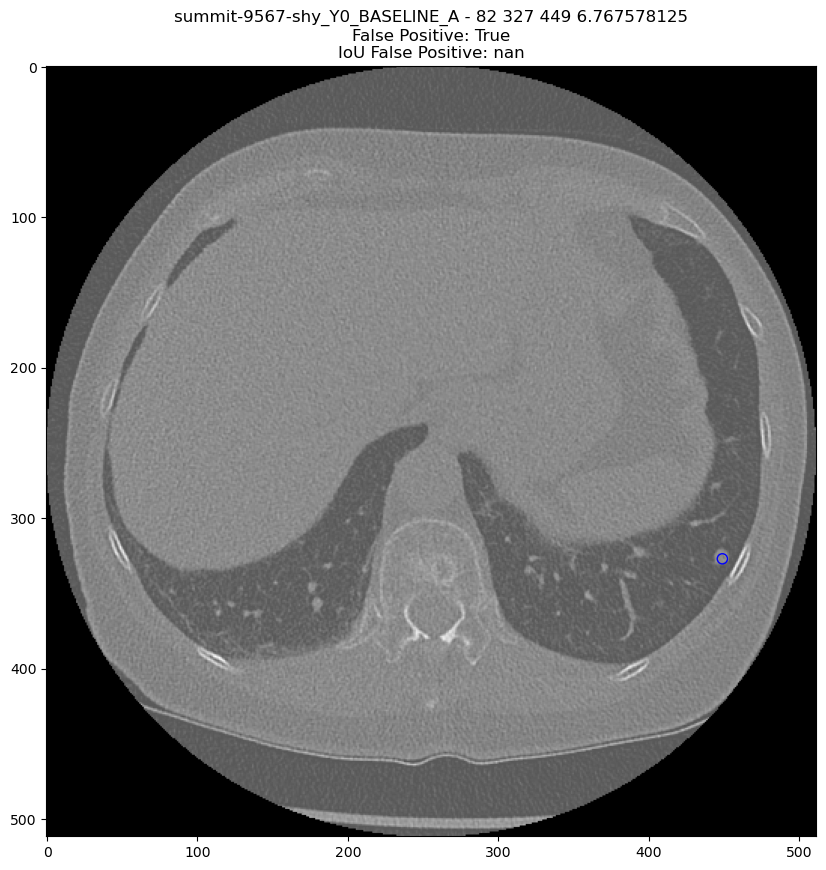

summit-3384-cuj_Y0_BASELINE_A already exists
summit-3384-cuj_Y0_BASELINE_A already exists
summit-3384-cuj_Y0_BASELINE_A - 285 268 387 5.9326171875
False Positive: True
IoU False Positive: nan


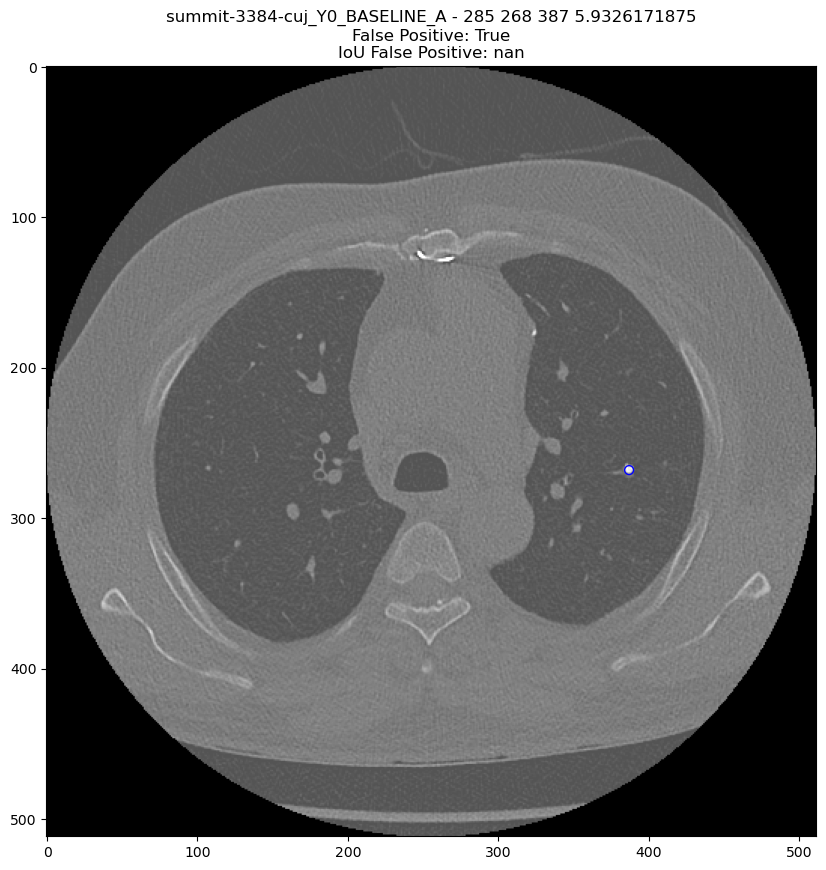

summit-5895-fyv_Y0_BASELINE_A already exists
summit-5895-fyv_Y0_BASELINE_A already exists
summit-5895-fyv_Y0_BASELINE_A - 184 337 204 4.482421875
False Positive: True
IoU False Positive: nan


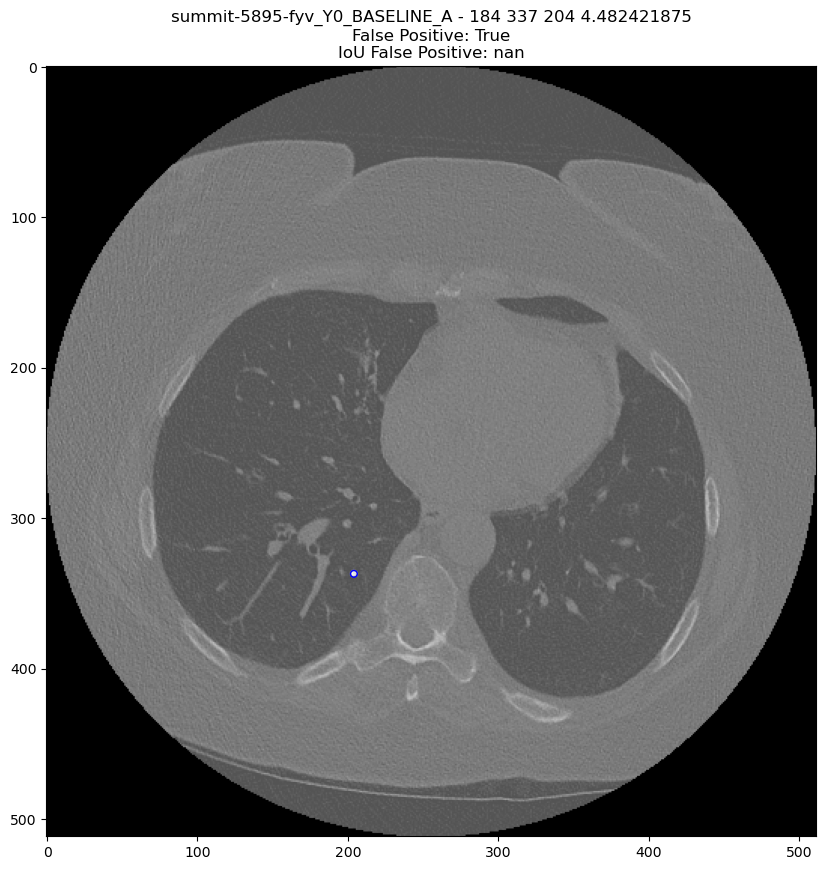

summit-5857-wzf_Y0_BASELINE_A already exists
summit-5857-wzf_Y0_BASELINE_A already exists
summit-5857-wzf_Y0_BASELINE_A - 157 279 447 5.5810546875
False Positive: True
IoU False Positive: 0.0


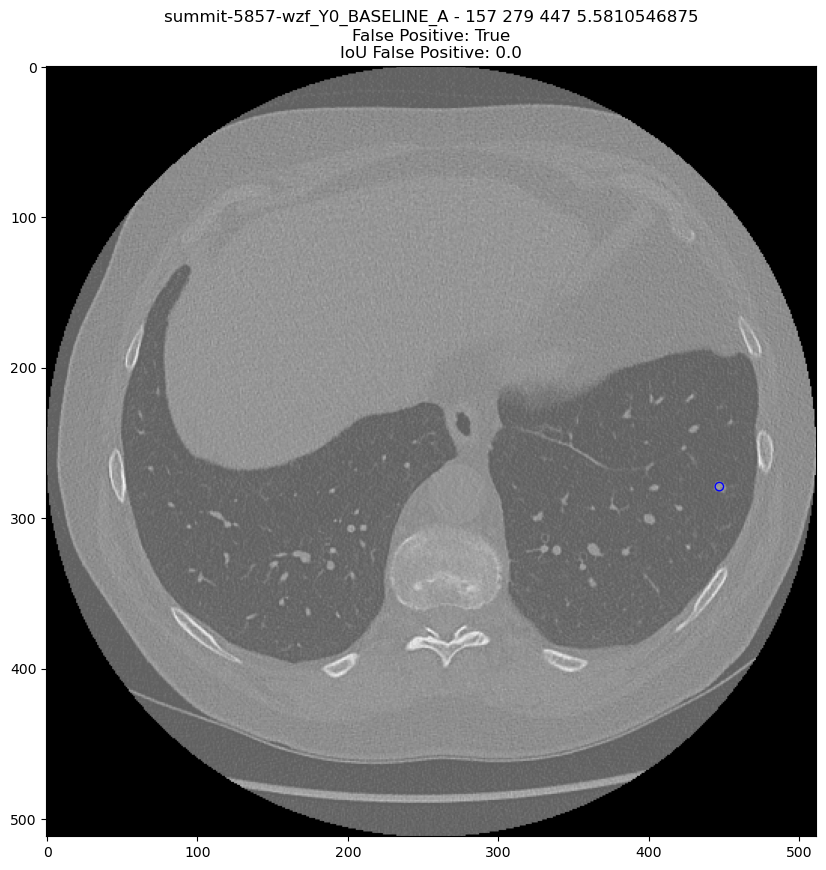

summit-8382-qrf_Y0_BASELINE_A already exists
summit-8382-qrf_Y0_BASELINE_A already exists
summit-8382-qrf_Y0_BASELINE_A - 161 370 108 5.80078125
False Positive: True
IoU False Positive: 0.0


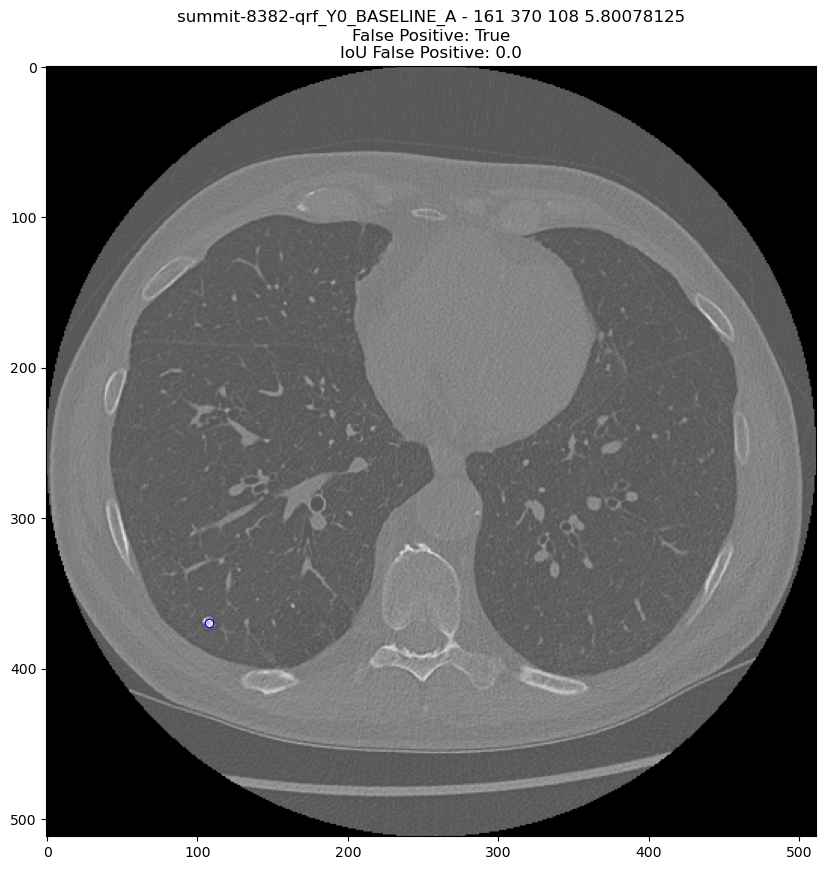

summit-8597-xev_Y0_BASELINE_A already exists
summit-8597-xev_Y0_BASELINE_A already exists
summit-8597-xev_Y0_BASELINE_A - 254 232 393 5.9765625
False Positive: True
IoU False Positive: 0.0


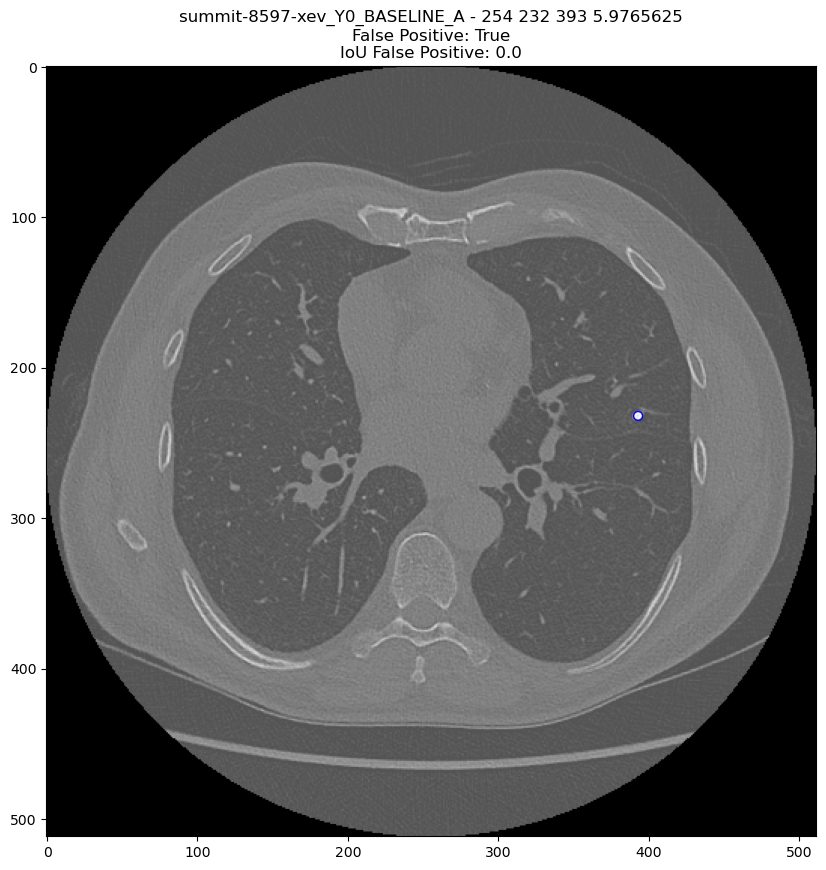

summit-5934-mhw_Y0_BASELINE_A already exists
summit-5934-mhw_Y0_BASELINE_A already exists
summit-5934-mhw_Y0_BASELINE_A - 248 296 441 5.185546875
False Positive: True
IoU False Positive: 0.0


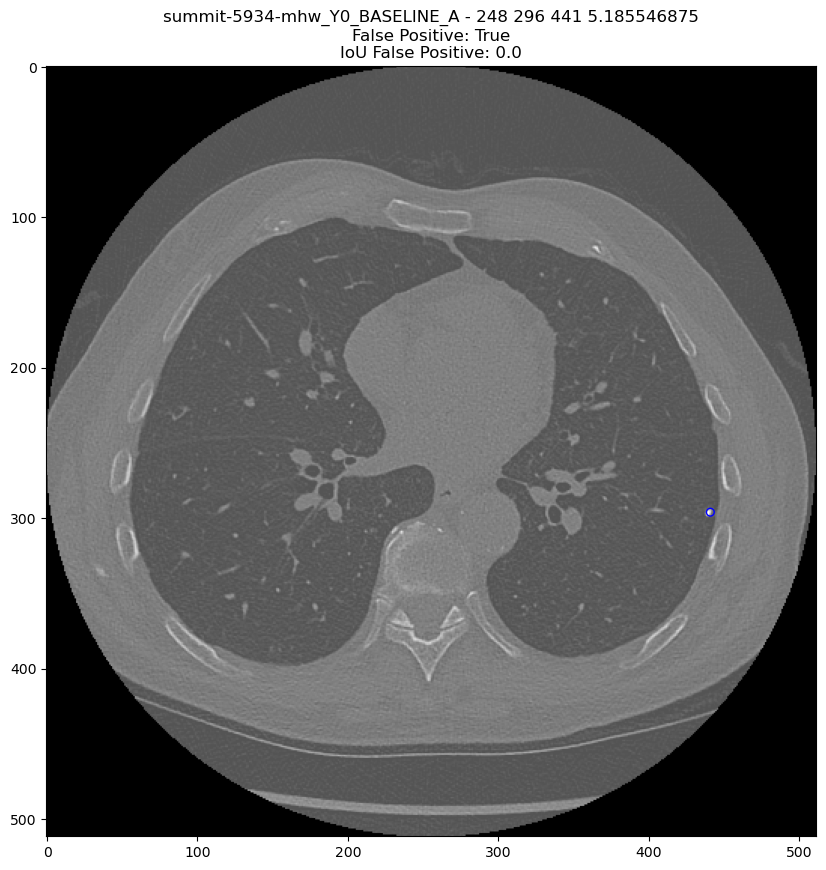

summit-6376-dfp_Y0_BASELINE_A already exists
summit-6376-dfp_Y0_BASELINE_A already exists
summit-6376-dfp_Y0_BASELINE_A - 426 204 174 8.4375
False Positive: True
IoU False Positive: 0.0


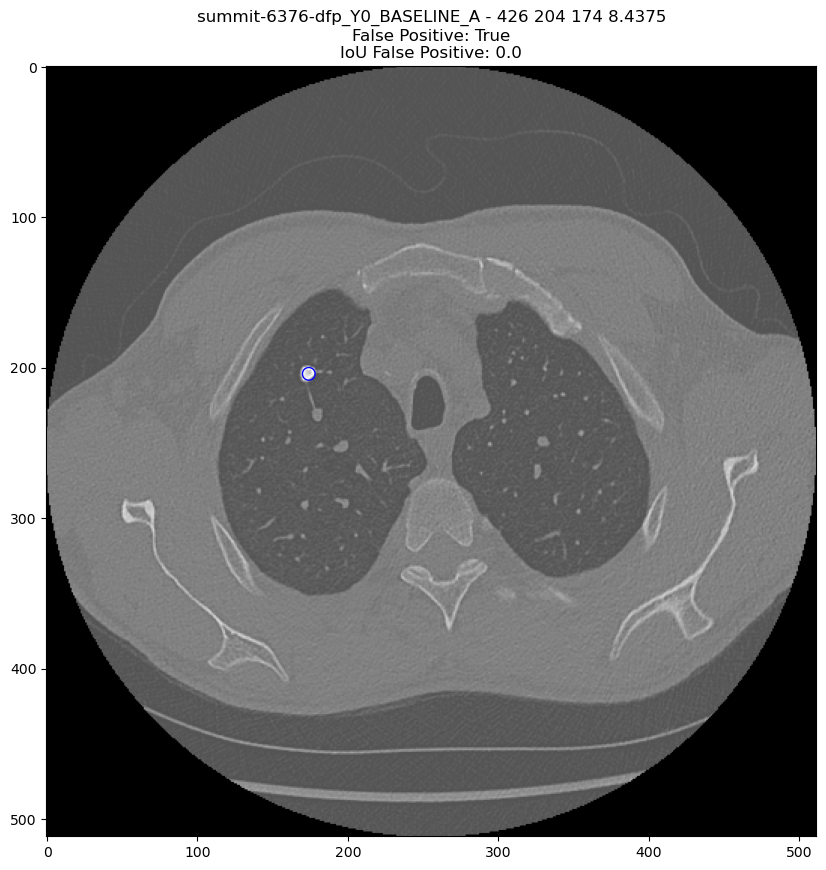

In [17]:
import sys

sys.path.append(f'{workspace_path}')

from utilities.utils import SummitScan, xyz2irc


df = false_positives_fpps['0.125']

cnt = 0
for idx, row in df[df.distance_false_positive].sort_values(by='threshold', ascending=False).iterrows():
    scan_id = row['name']
    study_id = scan_id.split('_')[0]
    x = row['row']
    y = row['col']
    z = row['index']
    diameter = row['diameter']
    

    copy_scan_from_cluster(scan_id)
    scan = SummitScan.load_scan(f'{workspace_path}/data/summit/scans/{study_id}/{scan_id}.mhd')

    irc = xyz2irc([x, y, z], scan.origin, scan.voxel_size, scan.orientation)

    show_mhd_candidate_location(scan_id, scan.image, irc.row, irc.col, irc.index, diameter, row.distance_false_positive, row.iou_false_positive)
    cnt+=1
    if cnt == 12:
        break